# ROAD SAFETY DATA - 2019

In [1]:
# !pip install geopandas
# !pip install folium
#!pip install catboost

In [2]:
# import sys
# !conda install --yes --prefix {sys.prefix} plotly

In [3]:
import csv
import pandas as pd
import numpy as np
from datetime import datetime
import datetime as dt
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
import seaborn as sns
import plotly.express as px
import geopandas as gpd
from geopandas import GeoDataFrame
import folium
from folium.plugins import MarkerCluster
from functools import reduce
import scipy.stats as stats
import math
%matplotlib inline

#algorithms 
from catboost import CatBoostRegressor, Pool, CatBoostClassifier
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix, f1_score, classification_report
from sklearn.metrics import roc_auc_score
#supress all warnings
import warnings
warnings.filterwarnings("ignore")

C:\Anaconda3\envs\geo_env\lib\site-packages\pyproj\__init__.py:89: UserWarning: pyproj unable to set database path.
  _pyproj_global_context_initialize()


In [4]:
#To ensure no columns is hidden from our view
pd.set_option('display.max_columns', None)

In [5]:
#import and load each of the datasets in a DataFrame
df_DV = pd.read_csv('Road Safety Data- Vehicles 2019.csv')
df_DC = pd.read_csv('Road Safety Data - Casualties 2019.csv')
df_DA = pd.read_csv('Road Safety Data - Accidents 2019.csv')

# Vehicles

In [6]:
df_DV.shape

(216381, 23)

In [7]:
df_DV.sample(5)

,Accident_Index,Vehicle_Reference,Vehicle_Type,Towing_and_Articulation,Vehicle_Manoeuvre,Vehicle_Location-Restricted_Lane,Junction_Location,Skidding_and_Overturning,Hit_Object_in_Carriageway,Vehicle_Leaving_Carriageway,Hit_Object_off_Carriageway,1st_Point_of_Impact,Was_Vehicle_Left_Hand_Drive?,Journey_Purpose_of_Driver,Sex_of_Driver,Age_of_Driver,Age_Band_of_Driver,Engine_Capacity_(CC),Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type,Vehicle_IMD_Decile
126674,2019350883631,2,9,0,18,0,0,0,0,0,0,1,1,5,2,55,8,1299,1,12,7,3,7
53773,2019051911278,1,9,0,9,0,5,0,0,0,0,1,1,6,1,34,6,1461,2,7,3,1,3
1596,2019010158292,1,9,0,4,0,1,0,0,0,0,2,1,6,1,21,5,-1,-1,-1,10,1,10
8447,2019010170054,3,9,0,2,6,1,0,0,0,0,1,1,6,3,-1,-1,2378,1,13,-1,-1,-1
167238,2019460842951,2,21,1,18,0,0,0,0,0,0,3,1,1,1,56,9,6693,2,6,1,1,1


In [8]:
#Check the columns in the vehicle dataset
df_DV.columns

Index(['Accident_Index', 'Vehicle_Reference', 'Vehicle_Type',
       'Towing_and_Articulation', 'Vehicle_Manoeuvre',
       'Vehicle_Location-Restricted_Lane', 'Junction_Location',
       'Skidding_and_Overturning', 'Hit_Object_in_Carriageway',
       'Vehicle_Leaving_Carriageway', 'Hit_Object_off_Carriageway',
       '1st_Point_of_Impact', 'Was_Vehicle_Left_Hand_Drive?',
       'Journey_Purpose_of_Driver', 'Sex_of_Driver', 'Age_of_Driver',
       'Age_Band_of_Driver', 'Engine_Capacity_(CC)', 'Propulsion_Code',
       'Age_of_Vehicle', 'Driver_IMD_Decile', 'Driver_Home_Area_Type',
       'Vehicle_IMD_Decile'],
      dtype='object')

In [9]:
#Check information on the columns
df_DV.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216381 entries, 0 to 216380
Data columns (total 23 columns):
 #   Column                            Non-Null Count   Dtype 
---  ------                            --------------   ----- 
 0   Accident_Index                    216381 non-null  object
 1   Vehicle_Reference                 216381 non-null  int64 
 2   Vehicle_Type                      216381 non-null  int64 
 3   Towing_and_Articulation           216381 non-null  int64 
 4   Vehicle_Manoeuvre                 216381 non-null  int64 
 5   Vehicle_Location-Restricted_Lane  216381 non-null  int64 
 6   Junction_Location                 216381 non-null  int64 
 7   Skidding_and_Overturning          216381 non-null  int64 
 8   Hit_Object_in_Carriageway         216381 non-null  int64 
 9   Vehicle_Leaving_Carriageway       216381 non-null  int64 
 10  Hit_Object_off_Carriageway        216381 non-null  int64 
 11  1st_Point_of_Impact               216381 non-null  int64 
 12  Wa

In [10]:
#Check for null values in all columns
df_DV.isnull().sum()

Accident_Index                      0
Vehicle_Reference                   0
Vehicle_Type                        0
Towing_and_Articulation             0
Vehicle_Manoeuvre                   0
Vehicle_Location-Restricted_Lane    0
Junction_Location                   0
Skidding_and_Overturning            0
Hit_Object_in_Carriageway           0
Vehicle_Leaving_Carriageway         0
Hit_Object_off_Carriageway          0
1st_Point_of_Impact                 0
Was_Vehicle_Left_Hand_Drive?        0
Journey_Purpose_of_Driver           0
Sex_of_Driver                       0
Age_of_Driver                       0
Age_Band_of_Driver                  0
Engine_Capacity_(CC)                0
Propulsion_Code                     0
Age_of_Vehicle                      0
Driver_IMD_Decile                   0
Driver_Home_Area_Type               0
Vehicle_IMD_Decile                  0
dtype: int64

In [11]:
#Check correlations of the features
df_DV.corr()

,Vehicle_Reference,Vehicle_Type,Towing_and_Articulation,Vehicle_Manoeuvre,Vehicle_Location-Restricted_Lane,Junction_Location,Skidding_and_Overturning,Hit_Object_in_Carriageway,Vehicle_Leaving_Carriageway,Hit_Object_off_Carriageway,1st_Point_of_Impact,Was_Vehicle_Left_Hand_Drive?,Journey_Purpose_of_Driver,Sex_of_Driver,Age_of_Driver,Age_Band_of_Driver,Engine_Capacity_(CC),Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type,Vehicle_IMD_Decile
Vehicle_Reference,1.000000,-0.004345,0.014726,-0.079158,0.001530,-0.045195,-0.063926,-0.059323,-0.081883,-0.087653,0.034098,-0.007651,0.019720,0.090108,-0.053993,-0.070838,0.000729,-0.015462,-0.056136,-0.020355,-0.044674,-0.020355
Vehicle_Type,-0.004345,1.000000,0.115102,-0.025466,0.004357,-0.037187,-0.020337,-0.002535,0.008418,0.008871,0.003645,-0.009330,-0.095377,0.047460,-0.027257,-0.049488,0.145324,0.015603,-0.032569,-0.075865,-0.071466,-0.075865
Towing_and_Articulation,0.014726,0.115102,1.000000,0.088351,0.044280,0.025983,0.077808,0.031876,0.043006,0.031378,0.096285,0.085907,-0.076877,-0.052314,0.046857,0.048010,0.175376,0.041039,0.018227,0.016176,0.037698,0.016176
Vehicle_Manoeuvre,-0.079158,-0.025466,0.088351,1.000000,0.054049,0.105826,0.258171,0.142083,0.199543,0.167725,0.057174,0.353056,-0.042079,-0.197179,0.106101,0.137830,-0.014105,-0.046927,0.019770,0.085995,0.112700,0.085995
Vehicle_Location-Restricted_Lane,0.001530,0.004357,0.044280,0.054049,1.000000,0.031772,0.081050,0.077442,0.086625,0.069264,0.065092,0.169312,-0.012495,-0.021495,0.000324,-0.002889,-0.006366,-0.037933,-0.024706,-0.010707,-0.017765,-0.010707
Junction_Location,-0.045195,-0.037187,0.025983,0.105826,0.031772,1.000000,0.027900,0.011155,0.007095,-0.013300,0.115097,0.162475,-0.010723,-0.065681,0.064361,0.074870,-0.029653,-0.009094,0.000829,0.032069,0.025621,0.032069
Skidding_and_Overturning,-0.063926,-0.020337,0.077808,0.258171,0.081050,0.027900,1.000000,0.184997,0.251492,0.235499,0.104175,0.254381,-0.037132,-0.134197,0.065421,0.092354,-0.010011,-0.018612,0.059196,0.072667,0.099805,0.072667
Hit_Object_in_Carriageway,-0.059323,-0.002535,0.031876,0.142083,0.077442,0.011155,0.184997,1.000000,0.187939,0.179136,0.044489,0.146623,0.006652,-0.054531,0.030873,0.038088,0.005763,0.010138,0.043965,0.015831,0.022537,0.015831
Vehicle_Leaving_Carriageway,-0.081883,0.008418,0.043006,0.199543,0.086625,0.007095,0.251492,0.187939,1.000000,0.512390,0.063116,0.182508,-0.011897,-0.091986,0.062537,0.079784,0.027201,0.029390,0.093912,0.067540,0.095817,0.067540
Hit_Object_off_Carriageway,-0.087653,0.008871,0.031378,0.167725,0.069264,-0.013300,0.235499,0.179136,0.512390,1.000000,0.039182,0.139358,0.006929,-0.073130,0.052201,0.066847,0.024171,0.026109,0.085382,0.053477,0.082685,0.053477


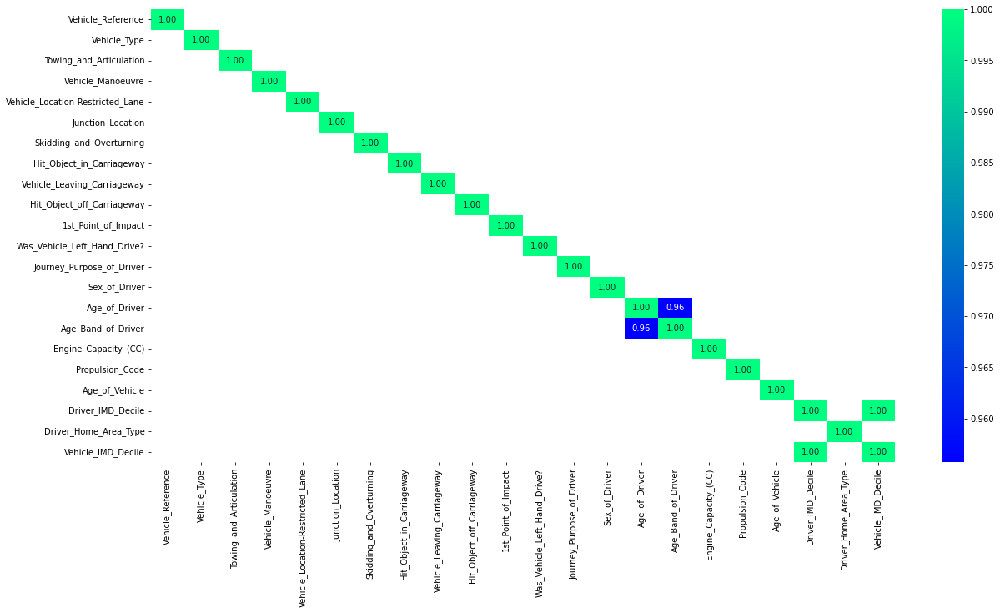

In [12]:
#Let us check correlation amongst variables set to minimum of 0.70
corr = df_DV.corr()
corr_min_70 = corr[corr>=0.70]

#Correlation heatmap
plt.figure(figsize=(20,10))
sns.heatmap(corr_min_70, cmap='winter', annot=True, fmt=".2f");

- A strong correlation can be seen between 'Age of driver' and 'Age band of driver'.

- Vehicle_IMD_Decile and Driver_IMD_Decile also have a strong correlation

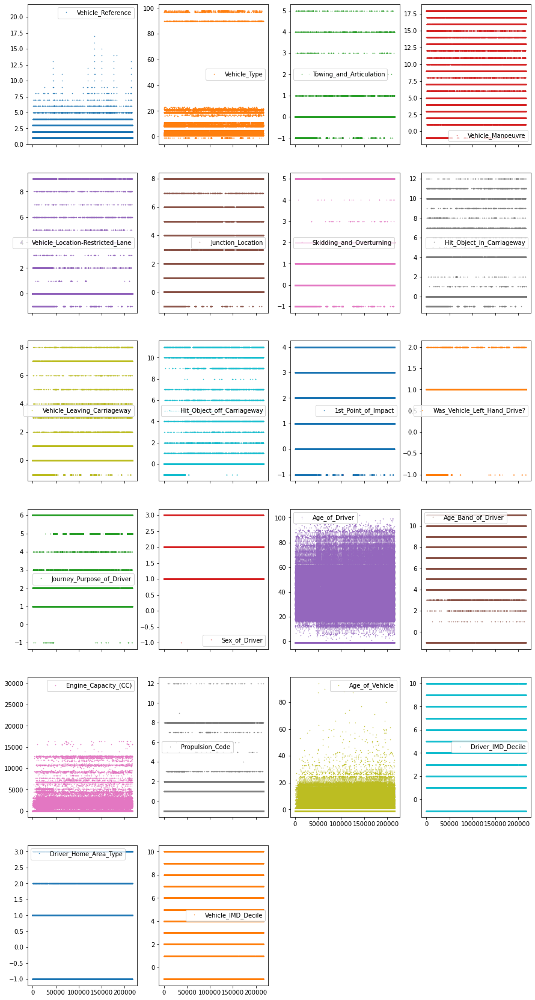

In [13]:
#Let's take a visual glance at the raw variables of the vehicle dataset
df_DV.plot(lw=0,
          marker=".",
          subplots=True,
          layout=(-1, 4),
          figsize=(15, 30),
          markersize=1);

# Casualty

In [14]:
df_DC.sample(5)

,Accident_Index,Vehicle_Reference,Casualty_Reference,Casualty_Class,Sex_of_Casualty,Age_of_Casualty,Age_Band_of_Casualty,Casualty_Severity,Pedestrian_Location,Pedestrian_Movement,Car_Passenger,Bus_or_Coach_Passenger,Pedestrian_Road_Maintenance_Worker,Casualty_Type,Casualty_Home_Area_Type,Casualty_IMD_Decile
53830,20191367U0052,1,1,1,1,40,7,2,0,0,0,0,0,9,-1,-1
67355,2019200885602,1,1,1,2,65,9,3,0,0,0,0,0,9,1,1
62234,2019170L10329,2,1,2,2,94,11,2,0,0,1,0,0,9,-1,-1
13830,2019010190430,1,1,1,1,28,6,3,0,0,0,0,0,5,1,3
133881,2019521905117,2,1,1,1,50,8,3,0,0,0,0,0,1,1,7


In [15]:
df_DC.columns

Index(['Accident_Index', 'Vehicle_Reference', 'Casualty_Reference',
       'Casualty_Class', 'Sex_of_Casualty', 'Age_of_Casualty',
       'Age_Band_of_Casualty', 'Casualty_Severity', 'Pedestrian_Location',
       'Pedestrian_Movement', 'Car_Passenger', 'Bus_or_Coach_Passenger',
       'Pedestrian_Road_Maintenance_Worker', 'Casualty_Type',
       'Casualty_Home_Area_Type', 'Casualty_IMD_Decile'],
      dtype='object')

In [16]:
df_DC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 153158 entries, 0 to 153157
Data columns (total 16 columns):
 #   Column                              Non-Null Count   Dtype 
---  ------                              --------------   ----- 
 0   Accident_Index                      153158 non-null  object
 1   Vehicle_Reference                   153158 non-null  int64 
 2   Casualty_Reference                  153158 non-null  int64 
 3   Casualty_Class                      153158 non-null  int64 
 4   Sex_of_Casualty                     153158 non-null  int64 
 5   Age_of_Casualty                     153158 non-null  int64 
 6   Age_Band_of_Casualty                153158 non-null  int64 
 7   Casualty_Severity                   153158 non-null  int64 
 8   Pedestrian_Location                 153158 non-null  int64 
 9   Pedestrian_Movement                 153158 non-null  int64 
 10  Car_Passenger                       153158 non-null  int64 
 11  Bus_or_Coach_Passenger              153

In [17]:
df_DC.isnull().sum()

Accident_Index                        0
Vehicle_Reference                     0
Casualty_Reference                    0
Casualty_Class                        0
Sex_of_Casualty                       0
Age_of_Casualty                       0
Age_Band_of_Casualty                  0
Casualty_Severity                     0
Pedestrian_Location                   0
Pedestrian_Movement                   0
Car_Passenger                         0
Bus_or_Coach_Passenger                0
Pedestrian_Road_Maintenance_Worker    0
Casualty_Type                         0
Casualty_Home_Area_Type               0
Casualty_IMD_Decile                   0
dtype: int64

In [18]:
df_DC.corr()

,Vehicle_Reference,Casualty_Reference,Casualty_Class,Sex_of_Casualty,Age_of_Casualty,Age_Band_of_Casualty,Casualty_Severity,Pedestrian_Location,Pedestrian_Movement,Car_Passenger,Bus_or_Coach_Passenger,Pedestrian_Road_Maintenance_Worker,Casualty_Type,Casualty_Home_Area_Type,Casualty_IMD_Decile
Vehicle_Reference,1.000000,0.067877,-0.258599,0.025018,0.040903,0.052084,0.081866,-0.255809,-0.220934,0.051404,-0.033511,-0.064693,0.085229,0.021012,0.039254
Casualty_Reference,0.067877,1.000000,0.047472,0.016832,-0.032687,-0.042025,0.014502,-0.037193,-0.029688,0.142201,0.066342,-0.010446,0.043674,-0.007306,-0.008361
Casualty_Class,-0.258599,0.047472,1.000000,0.128618,-0.111514,-0.162706,-0.073039,0.738887,0.643897,0.291465,0.090388,0.185860,-0.250677,-0.103062,-0.116923
Sex_of_Casualty,0.025018,0.016832,0.128618,1.000000,0.077624,0.084992,0.070190,0.021764,0.021433,0.115853,0.075830,0.005710,0.021432,0.042497,0.049742
Age_of_Casualty,0.040903,-0.032687,-0.111514,0.077624,1.000000,0.965168,-0.091342,-0.022923,-0.011016,-0.192799,0.047430,-0.011445,0.041720,0.105522,0.138331
Age_Band_of_Casualty,0.052084,-0.042025,-0.162706,0.084992,0.965168,1.000000,-0.084417,-0.047684,-0.030983,-0.229400,0.023707,-0.013808,0.046200,0.112159,0.138103
Casualty_Severity,0.081866,0.014502,-0.073039,0.070190,-0.091342,-0.084417,1.000000,-0.100796,-0.078114,0.054612,0.027139,-0.019232,0.059388,-0.015834,-0.006082
Pedestrian_Location,-0.255809,-0.037193,0.738887,0.021764,-0.022923,-0.047684,-0.100796,1.000000,0.827393,-0.150983,-0.046804,0.217798,-0.325661,-0.058785,-0.066446
Pedestrian_Movement,-0.220934,-0.029688,0.643897,0.021433,-0.011016,-0.030983,-0.078114,0.827393,1.000000,-0.131569,-0.040788,0.196285,-0.283796,-0.048603,-0.054241
Car_Passenger,0.051404,0.142201,0.291465,0.115853,-0.192799,-0.229400,0.054612,-0.150983,-0.131569,1.000000,-0.050199,-0.037978,0.104189,-0.046285,-0.060929


In [19]:
#Let us check correlation amongst variables set to minimum of 0.70
corr = df_DC.corr()
corr_min_70 = corr[corr>=0.70]

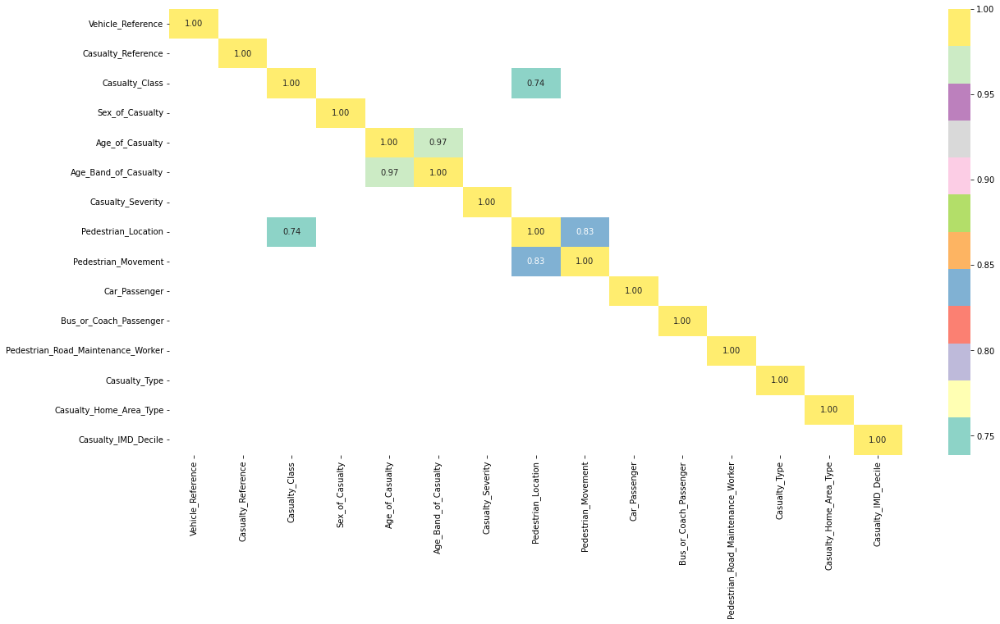

In [20]:
#Correlation heatmap
plt.figure(figsize=(20,10))
sns.heatmap(corr_min_70, cmap='Set3', annot=True, fmt=".2f");

-  A high correlation is observed between 'Casualty_Class','Pedestrian Movement', and 'Pedestrian Location'.
- As expected, a strong correlation between 'Age_of_Casualty' and 'Age_Band_of_Casualty'

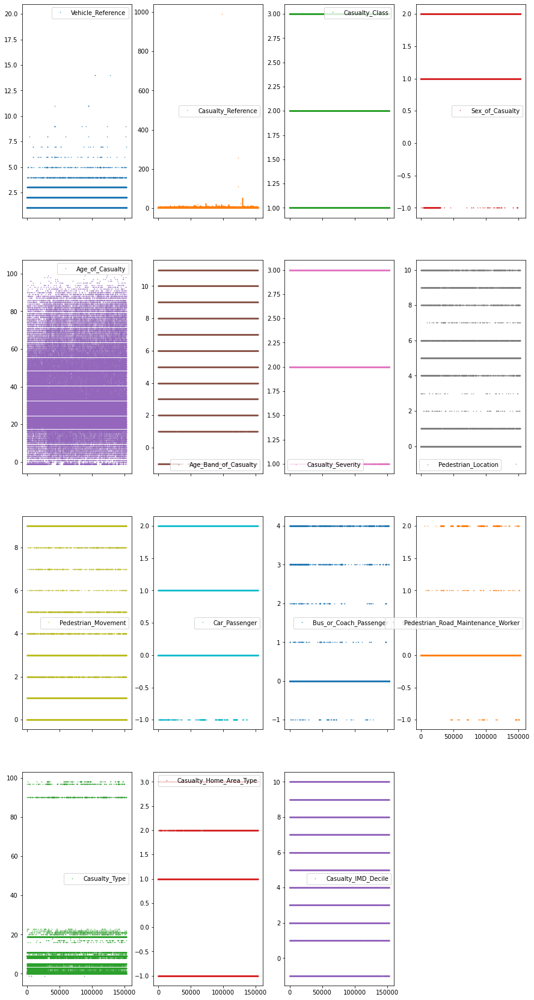

In [21]:
#A glance at the raw variables of the vehicle data
df_DC.plot(lw=0,
          marker=".",
          subplots=True,
          layout=(-1, 4),
          figsize=(15, 30),
          markersize=1);

# Accident

In [22]:
df_DA

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,Local_Authority_(District),Local_Authority_(Highway),1st_Road_Class,1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,Junction_Control,2nd_Road_Class,2nd_Road_Number,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location
0,2019010128300,528218.0,180407.0,-0.153842,51.508057,1,3,2,3,18/02/2019,2,17:50,1,E09000033,3,4202,1,30,1,2,3,4202,0,5,1,1,1,0,0,1,3,E01004762
1,2019010152270,530219.0,172463.0,-0.127949,51.436208,1,3,2,1,15/01/2019,3,21:45,9,E09000022,3,23,2,30,0,-1,-1,0,-1,-1,4,1,1,0,0,1,3,E01003117
2,2019010155191,530222.0,182543.0,-0.124193,51.526795,1,3,2,1,01/01/2019,3,01:50,2,E09000007,4,504,6,30,3,4,6,0,0,0,4,1,1,0,0,1,1,E01000943
3,2019010155192,525531.0,184605.0,-0.191044,51.546387,1,2,1,1,01/01/2019,3,01:20,2,E09000007,4,510,6,20,3,4,4,510,0,0,4,1,1,0,0,1,1,E01000973
4,2019010155194,524920.0,184004.0,-0.200064,51.541121,1,3,2,2,01/01/2019,3,00:40,28,E09000005,3,4003,6,30,6,4,6,0,0,0,4,1,1,0,0,1,1,E01000546
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117531,2019984106919,312635.0,573392.0,-3.368899,55.047323,98,3,1,1,18/05/2019,7,01:00,917,S12000006,4,725,6,60,0,-1,-1,0,0,0,1,1,2,0,0,2,1,NaN
117532,2019984107019,337522.0,591682.0,-2.983499,55.215407,98,3,4,1,30/05/2019,5,08:46,917,S12000006,3,7,6,60,0,-1,-1,0,0,0,1,1,2,0,0,2,1,NaN
117533,2019984107219,318544.0,567087.0,-3.274645,54.991685,98,3,2,1,21/06/2019,6,15:30,917,S12000006,4,723,6,60,3,4,4,721,0,0,1,1,1,0,0,2,2,NaN
117534,2019984107419,336525.0,584226.0,-2.997491,55.148292,98,3,1,1,29/06/2019,7,14:10,917,S12000006,6,710,6,30,3,4,6,723,0,0,1,1,1,0,0,2,2,NaN


In [23]:
df_DA.head(5)

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,Local_Authority_(District),Local_Authority_(Highway),1st_Road_Class,1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,Junction_Control,2nd_Road_Class,2nd_Road_Number,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location
0,2019010128300,528218.0,180407.0,-0.153842,51.508057,1,3,2,3,18/02/2019,2,17:50,1,E09000033,3,4202,1,30,1,2,3,4202,0,5,1,1,1,0,0,1,3,E01004762
1,2019010152270,530219.0,172463.0,-0.127949,51.436208,1,3,2,1,15/01/2019,3,21:45,9,E09000022,3,23,2,30,0,-1,-1,0,-1,-1,4,1,1,0,0,1,3,E01003117
2,2019010155191,530222.0,182543.0,-0.124193,51.526795,1,3,2,1,01/01/2019,3,01:50,2,E09000007,4,504,6,30,3,4,6,0,0,0,4,1,1,0,0,1,1,E01000943
3,2019010155192,525531.0,184605.0,-0.191044,51.546387,1,2,1,1,01/01/2019,3,01:20,2,E09000007,4,510,6,20,3,4,4,510,0,0,4,1,1,0,0,1,1,E01000973
4,2019010155194,524920.0,184004.0,-0.200064,51.541121,1,3,2,2,01/01/2019,3,00:40,28,E09000005,3,4003,6,30,6,4,6,0,0,0,4,1,1,0,0,1,1,E01000546


In [24]:
df_DA.columns

Index(['Accident_Index', 'Location_Easting_OSGR', 'Location_Northing_OSGR',
       'Longitude', 'Latitude', 'Police_Force', 'Accident_Severity',
       'Number_of_Vehicles', 'Number_of_Casualties', 'Date', 'Day_of_Week',
       'Time', 'Local_Authority_(District)', 'Local_Authority_(Highway)',
       '1st_Road_Class', '1st_Road_Number', 'Road_Type', 'Speed_limit',
       'Junction_Detail', 'Junction_Control', '2nd_Road_Class',
       '2nd_Road_Number', 'Pedestrian_Crossing-Human_Control',
       'Pedestrian_Crossing-Physical_Facilities', 'Light_Conditions',
       'Weather_Conditions', 'Road_Surface_Conditions',
       'Special_Conditions_at_Site', 'Carriageway_Hazards',
       'Urban_or_Rural_Area', 'Did_Police_Officer_Attend_Scene_of_Accident',
       'LSOA_of_Accident_Location'],
      dtype='object')

In [25]:
df_DA.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117536 entries, 0 to 117535
Data columns (total 32 columns):
 #   Column                                       Non-Null Count   Dtype  
---  ------                                       --------------   -----  
 0   Accident_Index                               117536 non-null  object 
 1   Location_Easting_OSGR                        117508 non-null  float64
 2   Location_Northing_OSGR                       117508 non-null  float64
 3   Longitude                                    117508 non-null  float64
 4   Latitude                                     117508 non-null  float64
 5   Police_Force                                 117536 non-null  int64  
 6   Accident_Severity                            117536 non-null  int64  
 7   Number_of_Vehicles                           117536 non-null  int64  
 8   Number_of_Casualties                         117536 non-null  int64  
 9   Date                                         117536 non-nul

In [26]:
df_DA.isnull().sum()

Accident_Index                                    0
Location_Easting_OSGR                            28
Location_Northing_OSGR                           28
Longitude                                        28
Latitude                                         28
Police_Force                                      0
Accident_Severity                                 0
Number_of_Vehicles                                0
Number_of_Casualties                              0
Date                                              0
Day_of_Week                                       0
Time                                             63
Local_Authority_(District)                        0
Local_Authority_(Highway)                         0
1st_Road_Class                                    0
1st_Road_Number                                   0
Road_Type                                         0
Speed_limit                                       0
Junction_Detail                                   0
Junction_Con

- From the above, 6 variables contain null values: Location_Easting_OSGR - 28,Location_Northing_OSGR - 28, Longitude - 28, Latitude - 28, Time - 63, LSOA_of_Accident_Location - 5714.

In [27]:
df_DA.nunique()

Accident_Index                                 117536
Location_Easting_OSGR                           93266
Location_Northing_OSGR                          93874
Longitude                                      115009
Latitude                                       113563
Police_Force                                       51
Accident_Severity                                   3
Number_of_Vehicles                                 16
Number_of_Casualties                               18
Date                                              365
Day_of_Week                                         7
Time                                             1439
Local_Authority_(District)                        380
Local_Authority_(Highway)                         207
1st_Road_Class                                      6
1st_Road_Number                                  3610
Road_Type                                           6
Speed_limit                                         7
Junction_Detail             

- The above gives more insight on the different attributes of the accidents variables.

In [28]:
df_DA.corr()

,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Day_of_Week,Local_Authority_(District),1st_Road_Class,1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,Junction_Control,2nd_Road_Class,2nd_Road_Number,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident
Location_Easting_OSGR,1.000000,-0.411873,0.999422,-0.414229,-0.372489,0.049902,0.026829,-0.036553,0.001453,-0.399926,-0.026325,-0.108857,-0.025937,-0.106264,0.027251,0.007665,0.056005,-0.042036,-0.060616,0.053541,0.018494,0.010338,-0.075767,-0.017618,-0.018174,-0.116272,0.119492
Location_Northing_OSGR,-0.411873,1.000000,-0.420575,0.999970,0.143741,-0.077572,-0.024706,0.029731,0.005177,0.107703,0.028226,0.041644,0.008509,0.084266,-0.018257,-0.011728,-0.046846,0.016488,0.064284,-0.008275,-0.019973,-0.007206,0.063780,0.010567,0.015612,0.044446,-0.037530
Longitude,0.999422,-0.420575,1.000000,-0.422843,-0.383074,0.050838,0.027122,-0.036067,0.001474,-0.407511,-0.024267,-0.107363,-0.025569,-0.105310,0.026022,0.007883,0.055645,-0.041384,-0.060101,0.052247,0.018368,0.009542,-0.076049,-0.017605,-0.018548,-0.113927,0.117964
Latitude,-0.414229,0.999970,-0.422843,1.000000,0.141971,-0.077397,-0.024604,0.029697,0.005180,0.106315,0.028275,0.042541,0.008406,0.083918,-0.018034,-0.011302,-0.046512,0.017231,0.064342,-0.008047,-0.020032,-0.007270,0.063736,0.010557,0.015531,0.043895,-0.037642
Police_Force,-0.372489,0.143741,-0.383074,0.141971,1.000000,-0.075306,0.003317,0.044746,-0.007086,0.981251,0.035139,0.020764,0.027770,0.255286,-0.118889,-0.066240,-0.136435,0.010788,0.092397,-0.103463,-0.007928,-0.044644,0.094207,0.032883,0.039963,0.276630,-0.185018
Accident_Severity,0.049902,-0.077572,0.050838,-0.077397,-0.075306,1.000000,0.070422,-0.080726,0.005523,-0.075573,0.009493,-0.011554,-0.034068,-0.100729,0.027480,0.034808,0.053084,0.018000,-0.039398,0.013290,-0.045591,0.031340,-0.022880,-0.005378,-0.016233,-0.101425,0.157527
Number_of_Vehicles,0.026829,-0.024706,0.027122,-0.024604,0.003317,0.070422,1.000000,0.216820,-0.003074,0.006056,-0.135766,-0.005445,-0.075340,0.110562,0.026155,0.039090,0.032587,0.012590,-0.011279,-0.061323,-0.064116,-0.035627,-0.027372,-0.007848,-0.027875,0.054770,-0.036605
Number_of_Casualties,-0.036553,0.029731,-0.036067,0.029697,0.044746,-0.080726,0.216820,1.000000,0.003757,0.050471,-0.086313,0.010978,-0.014943,0.168054,-0.008786,-0.025913,-0.041234,-0.000895,0.019680,-0.031470,0.030105,-0.025284,0.028684,0.014586,0.009938,0.136344,-0.107248
Day_of_Week,0.001453,0.005177,0.001474,0.005180,-0.007086,0.005523,-0.003074,0.003757,1.000000,-0.007157,0.000857,0.000177,-0.002266,-0.013497,0.005399,0.004149,0.006556,0.002125,-0.002382,0.000094,0.012986,0.015608,0.025879,0.001998,-0.002542,-0.013823,0.006498
Local_Authority_(District),-0.399926,0.107703,-0.407511,0.106315,0.981251,-0.075573,0.006056,0.050471,-0.007157,1.000000,0.047015,0.030351,0.031360,0.265649,-0.126216,-0.065312,-0.141439,0.013051,0.099025,-0.114085,-0.008994,-0.047146,0.098205,0.033928,0.040867,0.292673,-0.198447


In [29]:
#Let us check correlation amongst variables set to minimum of 0.65
corr = df_DA.corr()
corr_min_65 = corr[corr>=0.65]

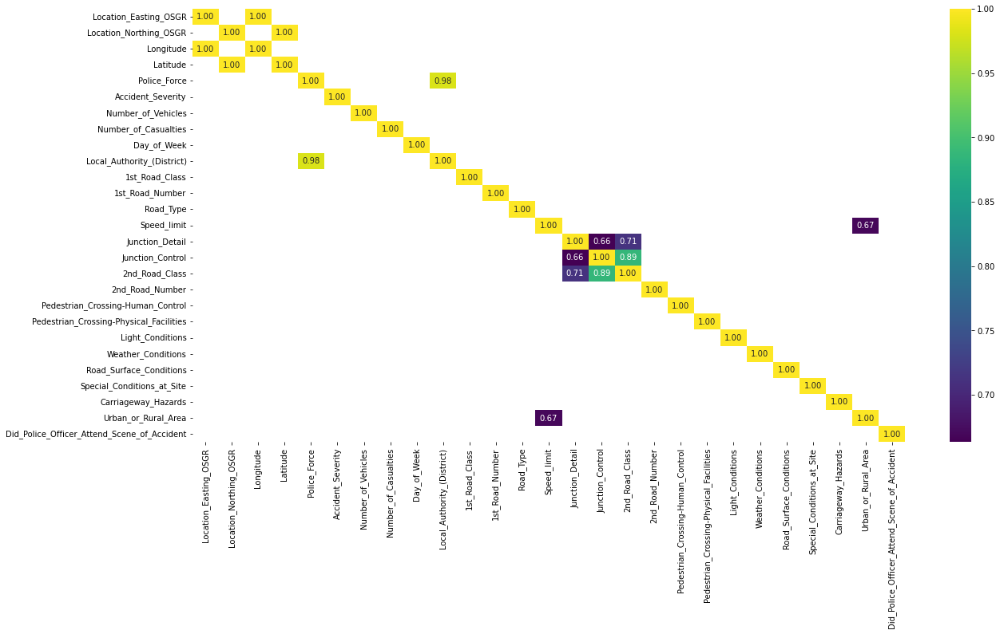

In [30]:
#Correlation heatmap
plt.figure(figsize=(20,10))
sns.heatmap(corr_min_65, cmap='viridis', annot=True, fmt=".2f");

- Some interesting correlation was seen between 'Speed limit' and 'Urban or Rural Area';
- Similar correlation exists between 'Junction detail','Junction Control' and '2nd Road Class';
- A strong correlation also exists between 'Police Force' and 'Local Authority_(District)';
- A high correlation exists between 'Latitude' and 'Location Northing_OSGR', as well as between 'Longitude' and 'Location Easting_OSGR'.
   This correlation is expected since each pair say the same thing.

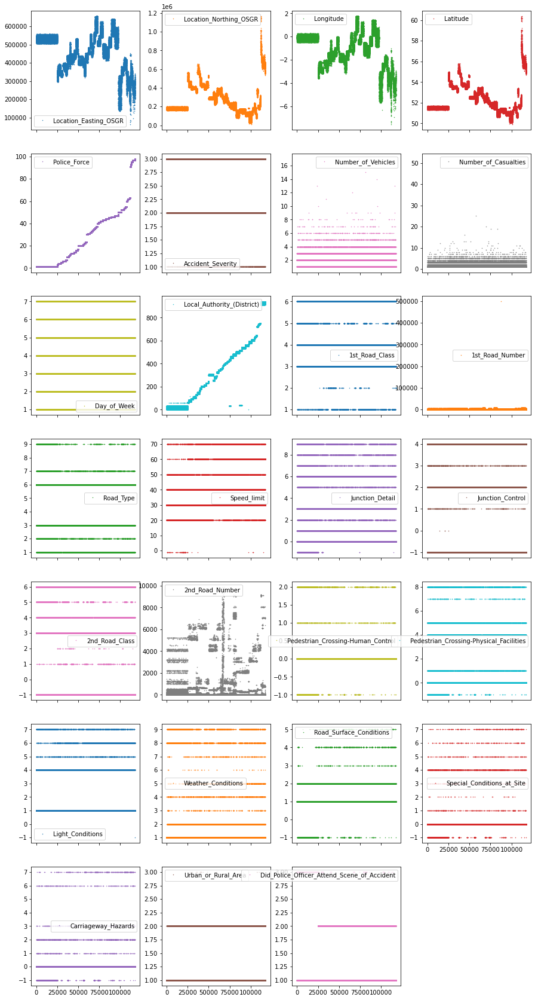

In [31]:
#Visualisation of raw accident variables
df_DA.plot(lw=0,
          marker=".",
          subplots=True,
          layout=(-1, 4),
          figsize=(15, 30),
          markersize=1);

In [32]:
# #Generate profile report to explore and see correlations of our data before cleaning 
# from pandas_profiling import ProfileReport
 
# #title parameter for naming our report, and explorative parameter set to True for Deeper exploration.
# profile = ProfileReport(df_DA, title='Road Safety Data - Accidents 2019 Pandas Profiling Report', explorative = True)

In [33]:
#profile

# Data Cleaning - Time

In [34]:
unique_Time = df_DA['Time'].unique()

In [35]:
print(unique_Time)

['17:50' '21:45' '01:50' ... '02:29' '04:39' '04:48']


In [36]:
time = df_DA['Time']

In [37]:
# Use the mode to fill missing 'Time' values
df_DA['Time'].fillna(df_DA['Time'].mode()[0], inplace=True)

In [38]:
date = df_DA['Date'].str.cat(df_DA['Time'], sep =' ')
date = pd.to_datetime(date)

In [39]:
df_DA['Converted_time'] = pd.DatetimeIndex(df_DA['Time'])

In [40]:
df_DA['decimal_time'] = df_DA['Converted_time'].dt.hour + df_DA['Converted_time'].dt.minute/60

In [41]:
df_DA['decimal_time']= df_DA['decimal_time'].round(decimals = 2)
df_DA['Week'] = pd.to_datetime(df_DA['Date']).dt.week
df_DA['Month'] = pd.to_datetime(df_DA['Date']).dt.month
df_DA['Hour'] = pd.to_datetime(df_DA['Time']).dt.hour
df_DA['date'] = pd.to_datetime(df_DA['Date'])
df_DA['day'] = df_DA['date'].dt.strftime('%d')
df_DA['day']

0         18
1         15
2         01
3         01
4         01
          ..
117531    18
117532    30
117533    21
117534    29
117535    21
Name: day, Length: 117536, dtype: object

In [42]:
df_DA['Time']

0         17:50
1         21:45
2         01:50
3         01:20
4         00:40
          ...  
117531    01:00
117532    08:46
117533    15:30
117534    14:10
117535    12:45
Name: Time, Length: 117536, dtype: object

# Data Cleaning - Accident Location

- Latitude
- Longitude
- Location_Easting_OSGR
- Location_Northing_OSGR
- LSOA of Accident Location

In [43]:
#To get the missing geographic locations of accident we group by 'Police_Force'
mode = df_DA.groupby('Police_Force')
location = mode.get_group(4)

In [44]:
#To generate the codes for each Police Force Label
unique_police_code = df_DA['Police_Force'].unique()
code = unique_police_code.tolist()

Latitude = []
Longitude = []
Location_Easting_OSGR = []
Location_Northing_OSGR = []

print(code)

[1, 3, 4, 5, 6, 7, 10, 11, 12, 13, 14, 16, 17, 20, 21, 22, 23, 30, 31, 32, 33, 34, 35, 36, 37, 40, 41, 42, 43, 44, 45, 46, 47, 48, 50, 52, 53, 54, 55, 60, 61, 62, 63, 91, 92, 93, 94, 95, 96, 97, 98]


In [45]:
#Append the Police Force codes to the corresponding location
for j in code:
    filling = mode.get_group(j)
    Latitude.append(filling['Latitude'].mean())
    Longitude.append(filling['Longitude'].mean())
    Location_Easting_OSGR.append(filling['Location_Easting_OSGR'].mean())
    Location_Northing_OSGR.append(filling['Location_Northing_OSGR'].mean())
    
Latitude_code = dict(zip(code,Latitude))
Longitude_code = dict(zip(code,Longitude))
Location_Easting_OSGR_code = dict(zip(code,Location_Easting_OSGR))
Location_Northing_OSGR_code = dict(zip(code,Location_Northing_OSGR))

In [46]:
#Determine the index of missing columns
empty_rows = df_DA[df_DA['Latitude'].isna()]

In [47]:
#Use a function to create a tuple for Latitude and Longitude
def clean_column(df_DA,row,empty,column_name):
    for x in row.items():
        for y,z in empty.iterrows():
            if z['Police_Force']==x[0]:
                df_DA.loc[[y], (column_name)]=x[1]
    

In [48]:
clean_column(df_DA,Latitude_code,empty_rows,'Latitude')
clean_column(df_DA,Longitude_code,empty_rows,'Longitude')
clean_column(df_DA,Location_Easting_OSGR_code,empty_rows,'Location_Easting_OSGR')
clean_column(df_DA,Location_Northing_OSGR_code,empty_rows,'Location_Northing_OSGR')


In [49]:
df_DA['LSOA_of_Accident_Location'] = df_DA.groupby('Local_Authority_(District)')['LSOA_of_Accident_Location'].ffill()

In [50]:
df_DA[pd.isna(df_DA['LSOA_of_Accident_Location'])]

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,Local_Authority_(District),Local_Authority_(Highway),1st_Road_Class,1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,Junction_Control,2nd_Road_Class,2nd_Road_Number,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Converted_time,decimal_time,Week,Month,Hour,date,day
27337,2019040854828,356700.548847,432946.81038,-2.658851,53.790750,4,3,2,1,21/06/2019,6,20:15,114,E08000010,1,6,3,70,0,-1,-1,0,0,0,1,1,1,0,0,3,2,NaN,2022-04-29 20:15:00,20.25,25,6,20,2019-06-21,21
29031,2019050886495,347346.000000,392329.00000,-2.793842,53.425127,5,3,2,1,07/10/2019,2,08:25,90,E08000011,3,57,6,30,9,4,6,0,0,0,1,1,1,0,0,2,2,NaN,2022-04-29 08:25:00,8.42,28,7,8,2019-07-10,10
111852,2019910854452,206895.000000,758446.00000,-5.153738,56.677744,91,2,3,2,04/07/2019,5,14:00,927,S12000017,3,82,6,60,0,-1,-1,0,0,0,1,1,1,0,0,2,1,NaN,2022-04-29 14:00:00,14.00,14,4,14,2019-04-07,07
111853,2019910854510,257284.000000,907329.00000,-4.418537,58.032070,91,1,2,1,04/07/2019,5,12:09,927,S12000017,3,836,6,60,0,-1,-1,0,0,0,1,4,1,0,0,2,1,NaN,2022-04-29 12:09:00,12.15,14,4,12,2019-04-07,07
111854,2019910854905,273779.000000,846498.00000,-4.107387,57.491054,91,3,2,1,06/07/2019,7,15:40,927,S12000017,6,0,6,60,0,-1,-1,0,0,0,1,1,1,0,0,2,1,NaN,2022-04-29 15:40:00,15.67,23,6,15,2019-06-07,07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117531,2019984106919,312635.000000,573392.00000,-3.368899,55.047323,98,3,1,1,18/05/2019,7,01:00,917,S12000006,4,725,6,60,0,-1,-1,0,0,0,1,1,2,0,0,2,1,NaN,2022-04-29 01:00:00,1.00,20,5,1,2019-05-18,18
117532,2019984107019,337522.000000,591682.00000,-2.983499,55.215407,98,3,4,1,30/05/2019,5,08:46,917,S12000006,3,7,6,60,0,-1,-1,0,0,0,1,1,2,0,0,2,1,NaN,2022-04-29 08:46:00,8.77,22,5,8,2019-05-30,30
117533,2019984107219,318544.000000,567087.00000,-3.274645,54.991685,98,3,2,1,21/06/2019,6,15:30,917,S12000006,4,723,6,60,3,4,4,721,0,0,1,1,1,0,0,2,2,NaN,2022-04-29 15:30:00,15.50,25,6,15,2019-06-21,21
117534,2019984107419,336525.000000,584226.00000,-2.997491,55.148292,98,3,1,1,29/06/2019,7,14:10,917,S12000006,6,710,6,30,3,4,6,723,0,0,1,1,1,0,0,2,2,NaN,2022-04-29 14:10:00,14.17,26,6,14,2019-06-29,29


- We observe nan values are still present in 'LSOA_of_Accident_Location'. From the Lookup file provided, it appears to be LSOA for 2 Scotland locations (Dumfres and Galloway). These would be replaced with the appropriate LSOA of the location.

In [51]:
df_DA['LSOA_of_Accident_Location'] = df_DA['LSOA_of_Accident_Location'].fillna('S01007575')

In [52]:
#Check the DataFrame after cleaning
df_DA.isna().sum()

Accident_Index                                 0
Location_Easting_OSGR                          0
Location_Northing_OSGR                         0
Longitude                                      0
Latitude                                       0
Police_Force                                   0
Accident_Severity                              0
Number_of_Vehicles                             0
Number_of_Casualties                           0
Date                                           0
Day_of_Week                                    0
Time                                           0
Local_Authority_(District)                     0
Local_Authority_(Highway)                      0
1st_Road_Class                                 0
1st_Road_Number                                0
Road_Type                                      0
Speed_limit                                    0
Junction_Detail                                0
Junction_Control                               0
2nd_Road_Class      

- Merge Accidents, Casualty, and Vehicles Data files.

In [53]:
#Merge Accident and Casualty data
df_AC = [df_DA,df_DC]

In [54]:
df_AC = reduce(lambda left,right: pd.merge(left,right,on=['Accident_Index'],how='inner'), df_AC)

In [55]:
#We merge Accident and Vehicle data
df_AV = [df_DA,df_DV]

In [56]:
df_AV = reduce(lambda left,right: pd.merge(left,right,on=['Accident_Index'],how='inner'), df_AV)

In [57]:
#We merge Casualty and Vehicle data
df_CV = [df_DC,df_DV]

In [58]:
df_CV = reduce(lambda left,right: pd.merge(left,right,on=['Accident_Index','Vehicle_Reference'],how='inner'), df_CV)

In [59]:
# Merging Accidents, Casualties and Vehicles datasets
df3 = [df_AV, df_DC] 

In [60]:
df3 = reduce(lambda left,right: pd.merge(left,right,on=['Accident_Index','Vehicle_Reference'],how='inner'), df3)

In [61]:
df3.shape

(109518, 75)

In [62]:
#display fully merged data
df3.sample(5)

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,Local_Authority_(District),Local_Authority_(Highway),1st_Road_Class,1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,Junction_Control,2nd_Road_Class,2nd_Road_Number,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Converted_time,decimal_time,Week,Month,Hour,date,day,Vehicle_Reference,Vehicle_Type,Towing_and_Articulation,Vehicle_Manoeuvre,Vehicle_Location-Restricted_Lane,Junction_Location,Skidding_and_Overturning,Hit_Object_in_Carriageway,Vehicle_Leaving_Carriageway,Hit_Object_off_Carriageway,1st_Point_of_Impact,Was_Vehicle_Left_Hand_Drive?,Journey_Purpose_of_Driver,Sex_of_Driver,Age_of_Driver,Age_Band_of_Driver,Engine_Capacity_(CC),Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type,Vehicle_IMD_Decile,Casualty_Reference,Casualty_Class,Sex_of_Casualty,Age_of_Casualty,Age_Band_of_Casualty,Casualty_Severity,Pedestrian_Location,Pedestrian_Movement,Car_Passenger,Bus_or_Coach_Passenger,Pedestrian_Road_Maintenance_Worker,Casualty_Type,Casualty_Home_Area_Type,Casualty_IMD_Decile
20213,2019040874341,367990.0,428714.0,-2.486938,53.753814,4,3,2,1,02/09/2019,2,18:10,70,E06000008,6,0,6,30,9,4,6,0,0,0,1,1,2,0,0,1,2,E01012644,2022-04-29 18:10:00,18.17,6,2,18,2019-02-09,09,1,9,0,18,0,1,0,0,0,0,1,1,6,1,21,5,1398,1,14,2,1,2,1,2,1,18,4,3,0,0,1,0,0,9,1,2
41783,2019136AT1088,416333.0,432775.0,-1.753561,53.791052,13,2,2,16,29/10/2019,3,15:38,200,E08000032,3,6181,3,30,0,-1,-1,0,0,0,1,1,1,0,0,1,1,E01010834,2022-04-29 15:38:00,15.63,44,10,15,2019-10-29,29,1,11,0,5,8,0,0,0,1,1,1,1,1,1,64,9,7300,2,10,1,1,1,8,2,2,8,2,3,0,0,0,4,0,11,1,7
89619,2019521903208,350364.0,172319.0,-2.715644,51.447669,52,3,2,2,08/02/2019,6,18:09,605,E06000024,4,3128,6,50,3,4,6,0,0,0,4,5,2,0,0,2,1,E01014852,2022-04-29 18:09:00,18.15,31,8,18,2019-08-02,02,1,9,0,18,0,8,0,0,0,0,1,1,6,1,27,6,-1,-1,-1,-1,-1,-1,1,1,1,27,6,3,0,0,0,0,0,9,-1,-1
71897,2019331900985,458045.0,304115.0,-1.143806,52.631712,33,3,2,1,04/09/2019,4,14:29,364,E06000016,5,1751,6,30,6,2,5,1796,0,5,1,1,1,0,0,1,1,E01013778,2022-04-29 14:29:00,14.48,15,4,14,2019-04-09,09,1,9,0,4,0,2,0,0,0,0,1,1,2,2,30,6,-1,-1,-1,3,1,3,1,1,2,30,6,3,0,0,0,0,0,9,1,3
102953,2019921900288,391694.0,808199.0,-2.138974,57.164553,92,3,3,1,07/06/2019,6,16:25,910,S12000033,3,92,1,40,1,4,6,0,0,0,1,1,1,0,0,1,1,S01007575,2022-04-29 16:25:00,16.42,27,7,16,2019-07-06,06,2,9,0,18,0,3,1,0,0,0,1,1,5,2,29,6,1364,1,1,3,1,3,1,1,2,29,6,3,0,0,0,0,0,9,1,5


- several columns still have (-1) values, these will be cleaned next.

In [63]:
#define a function to replace (-1) values with the mean value of each variable
def replace_minus1_with_mean(df3, column):
    mean_value = (~(df3[column] == -1)).mean()
    df3.replace({column:{-1:round(mean_value)}}, inplace=True)
    return column, round(mean_value)

In [64]:
#Filter all columns with (-1) values into list(minus1_cols)
minus1_cols = df3.select_dtypes(include=['int64']).columns[df3[df3.select_dtypes(
    include=['int64']).columns.tolist()].copy().applymap(lambda x: '-1' in str(x)).any()].tolist()

In [65]:
#Finally we iterate through minus1_cols to replace all -1 values with the mean of each variable
for col in minus1_cols:
    replace_minus1_with_mean(df3, col)

In [66]:
#sanity check
df3.sample(8)

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,Local_Authority_(District),Local_Authority_(Highway),1st_Road_Class,1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,Junction_Control,2nd_Road_Class,2nd_Road_Number,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Converted_time,decimal_time,Week,Month,Hour,date,day,Vehicle_Reference,Vehicle_Type,Towing_and_Articulation,Vehicle_Manoeuvre,Vehicle_Location-Restricted_Lane,Junction_Location,Skidding_and_Overturning,Hit_Object_in_Carriageway,Vehicle_Leaving_Carriageway,Hit_Object_off_Carriageway,1st_Point_of_Impact,Was_Vehicle_Left_Hand_Drive?,Journey_Purpose_of_Driver,Sex_of_Driver,Age_of_Driver,Age_Band_of_Driver,Engine_Capacity_(CC),Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type,Vehicle_IMD_Decile,Casualty_Reference,Casualty_Class,Sex_of_Casualty,Age_of_Casualty,Age_Band_of_Casualty,Casualty_Severity,Pedestrian_Location,Pedestrian_Movement,Car_Passenger,Bus_or_Coach_Passenger,Pedestrian_Road_Maintenance_Worker,Casualty_Type,Casualty_Home_Area_Type,Casualty_IMD_Decile
50714,2019200832012,399835.0,293574.0,-2.003859,52.540039,20,3,2,5,15/03/2019,6,19:35,305,E08000028,6,0,6,30,3,4,6,0,0,0,4,1,1,0,0,1,2,E01009998,2022-04-29 19:35:00,19.58,11,3,19,2019-03-15,15,2,9,0,9,0,6,0,0,0,0,3,1,6,2,36,7,1499,2,2,1,1,1,5,2,1,58,9,3,0,0,2,0,0,9,1,3
68891,2019320234700,494049.0,330522.0,-0.604419,52.863996,32,3,2,1,08/05/2019,4,13:50,355,E10000019,4,6403,6,60,9,4,6,0,0,0,1,2,2,0,0,2,1,E01026315,2022-04-29 13:50:00,13.83,32,8,13,2019-08-05,05,2,9,0,18,0,1,0,0,7,0,2,1,1,2,26,6,799,2,9,10,2,10,1,1,2,26,6,3,0,0,0,0,0,9,2,10
47979,2019160883112,526524.0,407046.0,-0.091993,53.544842,16,3,3,1,20/09/2019,6,16:37,233,E06000012,3,1243,6,30,3,4,6,0,0,4,1,1,1,0,0,1,2,E01013185,2022-04-29 16:37:00,16.62,38,9,16,2019-09-20,20,1,3,0,3,0,1,0,0,0,0,3,1,6,1,1,1,125,1,6,1,1,1,1,1,1,1,1,3,0,0,0,0,0,3,1,1
50355,2019200825136,398060.0,295153.0,-2.030039,52.554230,20,3,2,1,26/02/2019,3,21:20,305,E08000028,6,0,6,30,0,1,1,0,0,0,4,1,1,0,0,1,2,E01010090,2022-04-29 21:20:00,21.33,9,2,21,2019-02-26,26,2,9,0,18,0,0,0,8,0,0,1,1,6,1,43,7,1398,2,17,1,1,1,1,1,1,43,7,3,0,0,0,0,0,9,1,1
85145,2019450831262,489699.0,161888.0,-0.713379,51.349002,45,3,2,1,12/04/2019,6,12:04,515,E10000030,3,30,1,40,1,2,3,30,0,0,1,1,1,0,0,1,1,E01030797,2022-04-29 12:04:00,12.07,49,12,12,2019-12-04,04,1,9,0,11,0,3,0,0,0,0,1,1,1,1,28,6,1498,1,1,9,1,9,1,1,1,28,6,3,0,0,0,0,0,9,1,9
103299,2019930869238,324862.0,737287.0,-3.222860,56.521582,93,3,1,3,05/08/2019,2,06:35,934,S12000024,3,923,6,60,6,4,5,0,0,0,1,2,2,0,0,2,1,S01007575,2022-04-29 06:35:00,6.58,19,5,6,2019-05-08,08,1,9,0,17,0,1,2,7,1,0,4,1,1,1,32,6,1461,2,16,1,1,1,1,2,1,34,6,3,0,0,1,0,0,9,1,1
77946,2019360910656,620581.0,314527.0,1.261984,52.683526,36,3,3,1,10/12/2019,3,15:03,401,E10000020,3,140,6,60,0,1,1,0,0,0,1,2,2,0,0,2,2,E01026536,2022-04-29 15:03:00,15.05,41,10,15,2019-10-12,12,2,9,0,18,0,0,0,0,0,0,1,1,6,2,68,10,2143,2,2,7,1,7,1,1,2,68,10,3,0,0,0,0,0,9,1,7
53965,2019200883792,418824.0,286552.0,-1.724276,52.476591,20,3,3,1,28/08/2019,4,09:04,306,E08000029,3,452,3,40,0,1,1,0,0,4,1,1,1,0,0,1,1,E01010128,2022-04-29 09:04:00,9.07,35,8,9,2019-08-28,28,2,9,0,4,0,0,0,0,0,0,2,1,2,1,20,4,1968,2,7,6,1,6,1,1,1,20,4,3,0,0,0,0,0,9,1,6


In [67]:
df_ACV = df3.copy()

# QUESTIONS

- (a)Are there significant hours of the day, and days of the week, on which accidents occur?

- TIME OF ACCIDENT

In [68]:
time_acc = df_DA[['Date','Day_of_Week','Time']]

In [69]:
#create the columns: hour,day,month and year
#creating year column
def year(string):
    return int(string[6:10])
time_acc['Year']=time_acc['Date'].apply(lambda x: year(x))

#creating month column
def month(string):
    return int(string[3:5])
time_acc['Month']=time_acc['Date'].apply(lambda x: month(x))

#creating day column
def day(string):
    return int(string[0:2])
time_acc['Day']=time_acc['Date'].apply(lambda x: day(x))

#creating hour column
def hour(string):
    s=string[0:2]
    return int(s)
time_acc['Hour']=time_acc['Time'].apply(lambda x: hour(x))

In [70]:
def Accident_Severity(x):
    if x == 1:
        return 'Fatal'
    elif x == 2:
        return 'Serious'
    else:
        return 'Slight'

In [71]:
#Visualize time of accidents: hour
# Let's use a function to show accident occurrences by hour,day of the week
def Countplot(data, var, color):
    sns.set(style="darkgrid")
    plt.figure(figsize=(15,8))
    varplot = sns.countplot(x= var,data=data, color = color)
    varplot.set(xlabel='var', ylabel='Accident Count')
    for p in varplot.patches: 
        height = p.get_height() 
        varplot.text(p.get_x()+p.get_width()/2., 
          height + 3, 
          '{:1.2f}'.format((height/len(data))*100)+'%',  
          ha="center") 
    plt.title(f"Count of Accident by: {var} of day")
    plt.xlabel(f"{var}")
    plt.ylabel("Accident Count")

In [72]:
#We use a function to show frequency of accidents by time and severity 
def Histplot(data,var, color):
    plt.figure(figsize=(12,10))
    sns.histplot(data=data, x=var,hue='Accident_Severity',bins=24,kde=True,palette='Paired')
    plt.title(f"Count of Accidents by: {var} ")
    plt.xlabel(f"{var}")
    plt.ylabel("Accident Count")
    

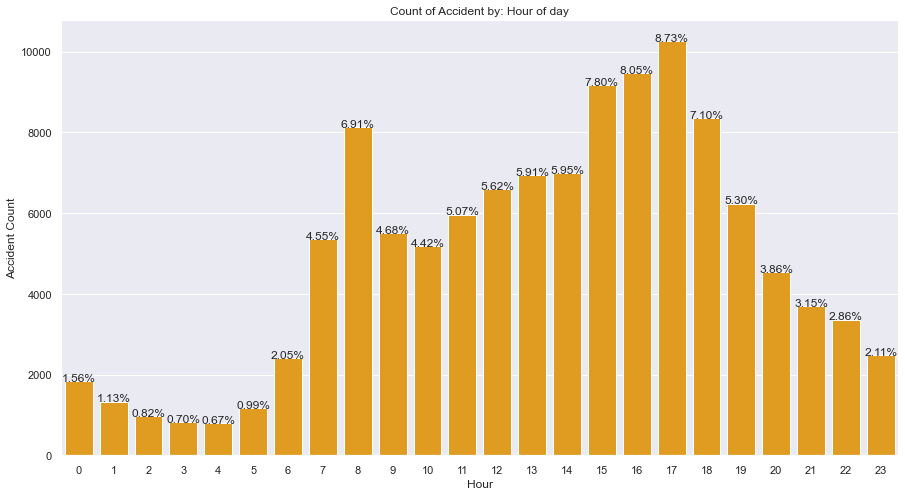

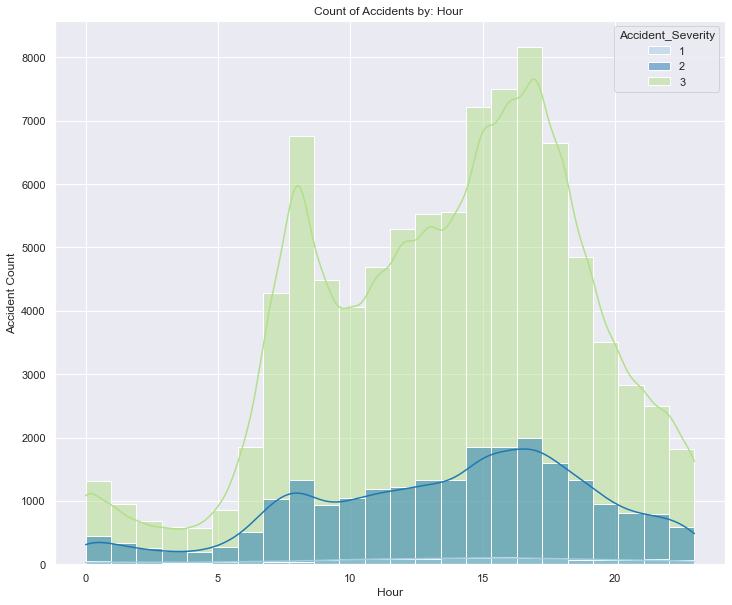

In [73]:
#Visualise accident occurrence by time of the day
Countplot(time_acc, 'Hour', color = "orange")
Histplot(df_DA, 'Hour', color = "lightgreen")

- About 30% of accidents occurred between 15:00 hours and 18:00 hours, while another 6.9% occurred around 08:00 hours. These are the peak periods

In [74]:
#Use function to visualize count of accidents by day of week
def Countplot(data, var, color):
    sns.set(style="darkgrid")
    plt.figure(figsize=(15,8))
    weekplot = sns.countplot(x= var,data=data, color = color)
    weekplot.set(xlabel='var', ylabel='Count')
    for p in weekplot.patches: 
        height = p.get_height() 
        weekplot.text(p.get_x()+p.get_width()/2., 
          height + 3, 
          '{:1.2f}'.format((height/len(data))*100)+'%',  
          ha="center")
    weekplot.set(xticklabels=['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday'])
    plt.title(f"Count of Accident by: {var}")
    plt.xlabel(f"{var}")
    plt.ylabel("Count")

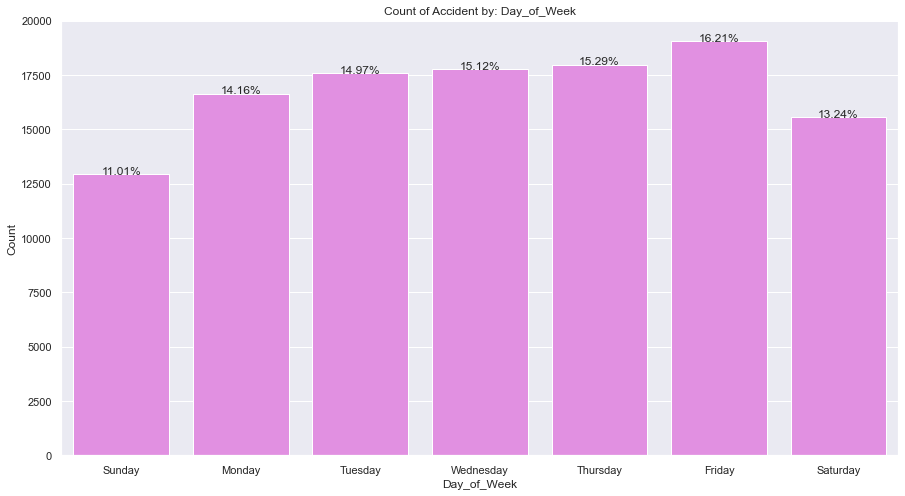

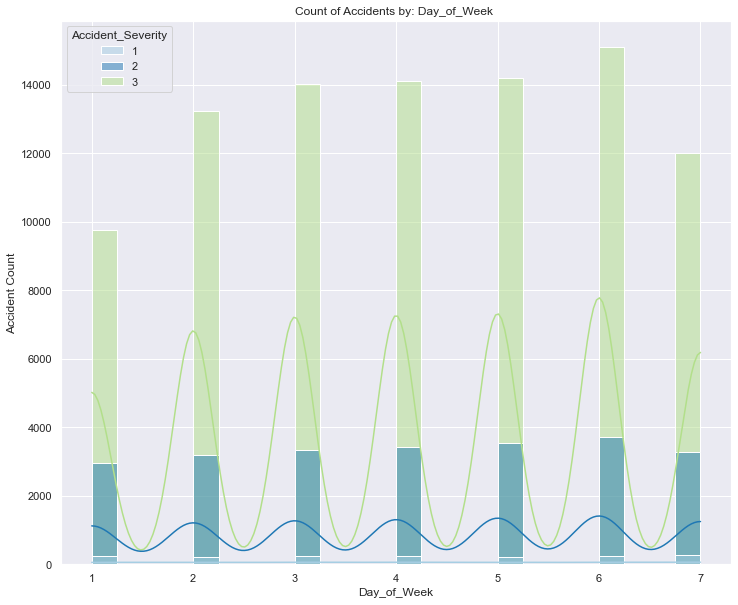

In [75]:
#Visualise accident occurrence by day of the week
Countplot(time_acc, 'Day_of_Week', color = "violet")
#xticklabels=['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday']
Histplot(df_DA, 'Day_of_Week', color = "lightgreen")

- It appears from the plot that more accidents are recorded on Fridays than any other day of the week.

- (b)For motorbikes, are there significant hours of the day, and days of the week, on which accidents occur?

In [76]:
#Let's map out motorbikes from "Vehicle_Type" and merge with accident DataFrame
motorbikes = df_DV[(df_DV['Vehicle_Type']==2) | (df_DV['Vehicle_Type']==3) | (df_DV['Vehicle_Type']==4) | (df_DV['Vehicle_Type']==5) | (df_DV['Vehicle_Type']==97) | (df_DV['Vehicle_Type']==23)]
motorbike_accidents = pd.merge(df_DA, motorbikes, on = ['Accident_Index'], how = 'inner')

In [77]:
motorbike_accidents.head(3)

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,Local_Authority_(District),Local_Authority_(Highway),1st_Road_Class,1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,Junction_Control,2nd_Road_Class,2nd_Road_Number,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Converted_time,decimal_time,Week,Month,Hour,date,day,Vehicle_Reference,Vehicle_Type,Towing_and_Articulation,Vehicle_Manoeuvre,Vehicle_Location-Restricted_Lane,Junction_Location,Skidding_and_Overturning,Hit_Object_in_Carriageway,Vehicle_Leaving_Carriageway,Hit_Object_off_Carriageway,1st_Point_of_Impact,Was_Vehicle_Left_Hand_Drive?,Journey_Purpose_of_Driver,Sex_of_Driver,Age_of_Driver,Age_Band_of_Driver,Engine_Capacity_(CC),Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type,Vehicle_IMD_Decile
0,2019010155225,512750.0,180199.0,-0.376691,51.509481,1,3,2,1,01/01/2019,3,00:50,27,E09000009,3,3005,6,30,3,4,6,0,0,0,4,1,1,0,0,1,1,E01001361,2022-04-29 00:50:00,0.83,1,1,0,2019-01-01,01,2,4,0,13,0,8,0,0,0,0,3,1,6,1,30,6,-1,-1,-1,4,1,4
1,2019010155254,534122.0,189977.0,-0.065175,51.592686,1,3,2,1,01/01/2019,3,14:18,31,E09000014,6,0,6,20,3,4,6,0,0,0,1,1,1,0,0,1,1,E01002080,2022-04-29 14:18:00,14.30,1,1,14,2019-01-01,01,1,3,0,6,0,2,0,4,1,0,1,1,1,1,19,4,-1,-1,-1,2,1,2
2,2019010155255,531638.0,180380.0,-0.104600,51.507028,1,3,1,1,01/01/2019,3,15:20,8,E09000028,3,3200,6,30,6,2,3,201,2,4,1,1,1,0,0,1,1,E01003934,2022-04-29 15:20:00,15.33,1,1,15,2019-01-01,01,1,3,0,7,0,5,0,0,0,0,0,1,6,1,54,8,-1,-1,-1,5,1,5


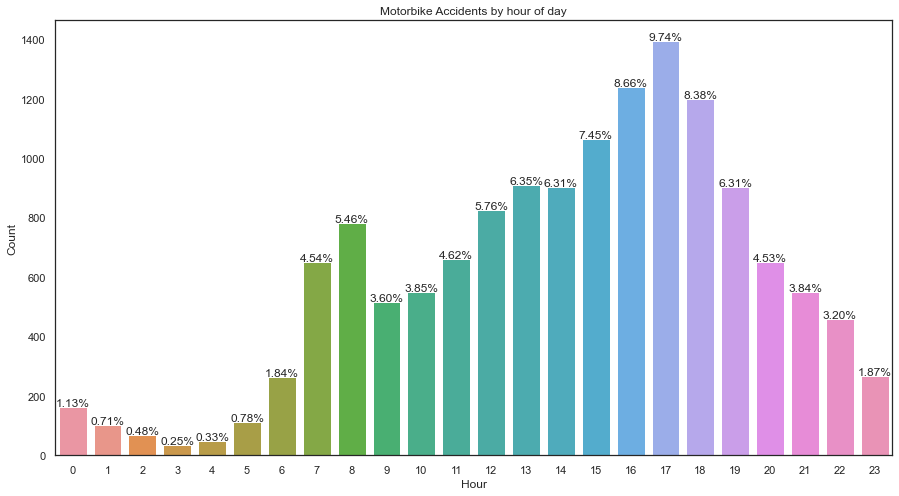

In [78]:
#Visualize time of motorbike accidents: hour
sns.set(style="white")
plt.figure(figsize=(15,8))
Hourplot = sns.countplot(x='Hour',data=motorbike_accidents)
Hourplot.set(xlabel='Hour', ylabel='Count')
for p in Hourplot.patches: 
    height = p.get_height() 
    Hourplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(motorbike_accidents))*100)+'%',  
      ha="center") 
plt.title('Motorbike Accidents by hour of day')
plt.show()

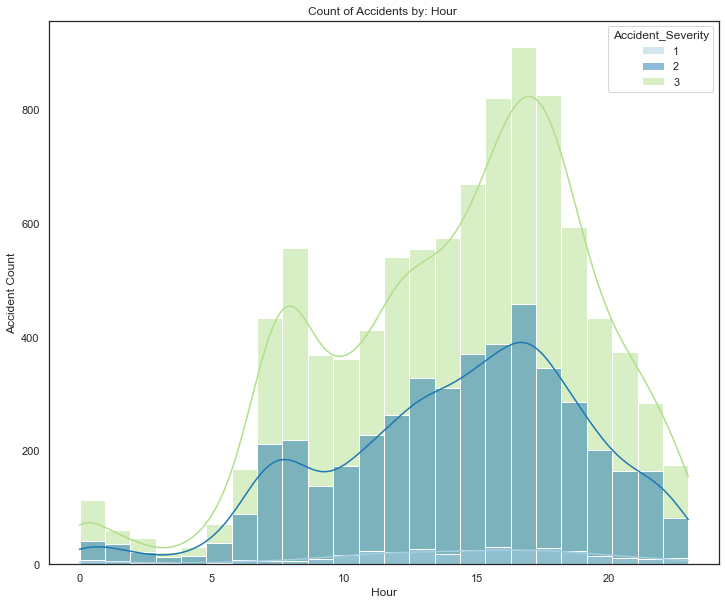

In [79]:
#Visualise motorbike accident occurrence by time of the day and severity
#Countplot(motorbike_accidents, 'Hour', color = "blue")
Histplot(motorbike_accidents, 'Hour', color = "lightgreen")

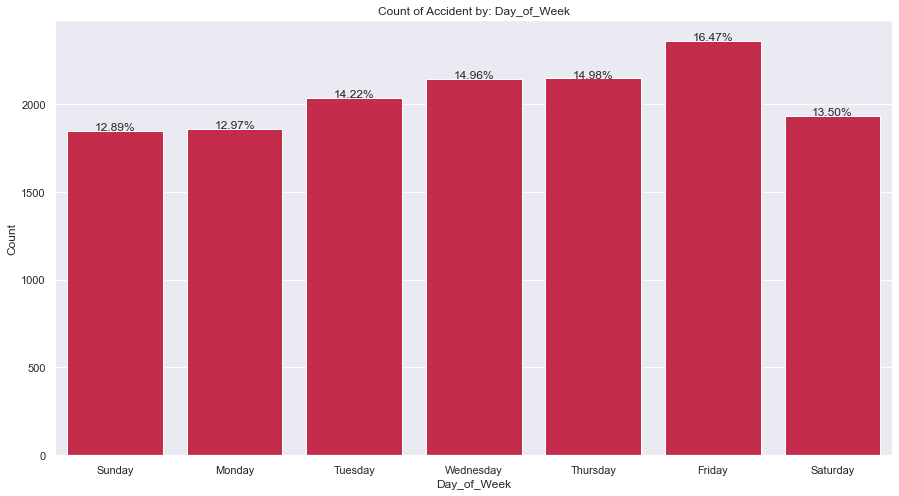

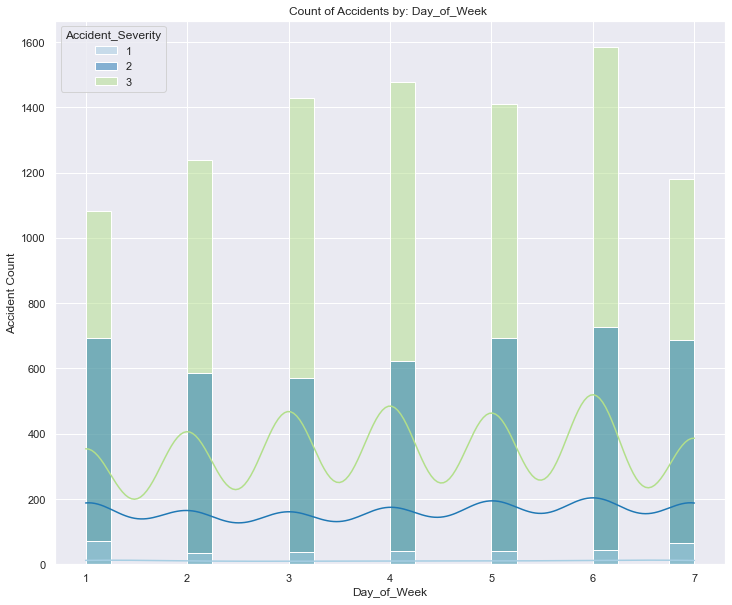

In [80]:
#Visualise motorbike accident occurrence by day of the week
Countplot(motorbike_accidents, 'Day_of_Week', color = "crimson")
#xticklabels=['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday']
Histplot(motorbike_accidents, 'Day_of_Week', color = "lightgreen")

- The highest number of motorbike accidents were recorded on Friday. Fatal accidents involving motorbikes were however more frequent on staurdays and Sundays than other days of the week.

- (c)For pedestrians involved in accidents, are there significant hours of the day, and days of the week, on which they are more likely to occur?

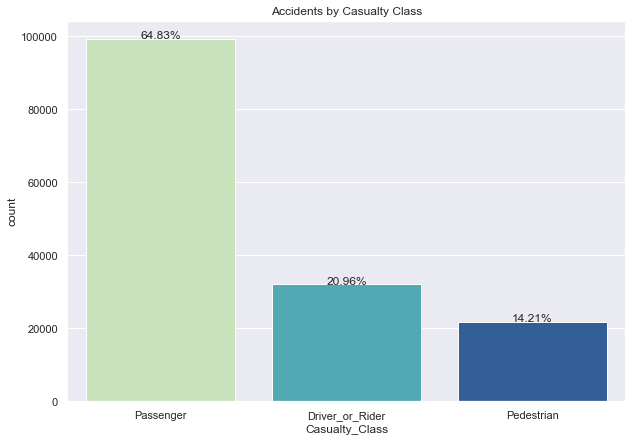

In [81]:
#Casualty class
plt.figure(figsize = (10,7))
Casualty_Classplot=sns.countplot('Casualty_Class', data=df_DC, palette = "YlGnBu",order = df_DC["Casualty_Class"].value_counts().index)
Casualty_Classplot.set_xticklabels(['Passenger','Driver_or_Rider','Pedestrian'])
for p in Casualty_Classplot.patches: 
    height = p.get_height() 
    Casualty_Classplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(df_DC))*100)+'%',  
      ha="center") 
plt.title('Accidents by Casualty Class');

- Pedestrians accounted for about 14% of accident casualties in 2019 as shown in the above plot.

In [82]:
pedestrians = df_AC[(df_AC['Casualty_Class']==3)]

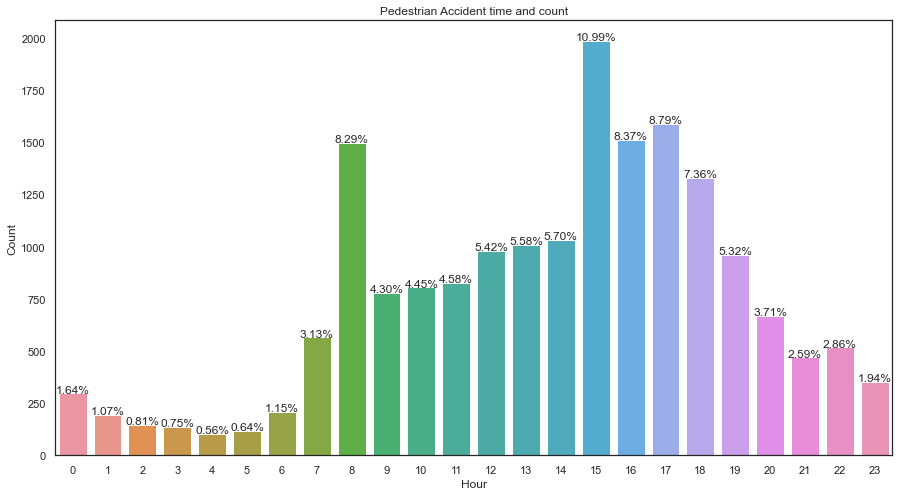

In [83]:
#Visualize time of Pedestrian accidents: hour
sns.set(style="white")
plt.figure(figsize=(15,8))
Hourplot = sns.countplot(x='Hour',data=pedestrians)
Hourplot.set(xlabel='Hour', ylabel='Count')
for p in Hourplot.patches: 
    height = p.get_height() 
    Hourplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(pedestrians))*100)+'%',  
      ha="center") 
plt.title('Pedestrian Accident time and count')
plt.show()

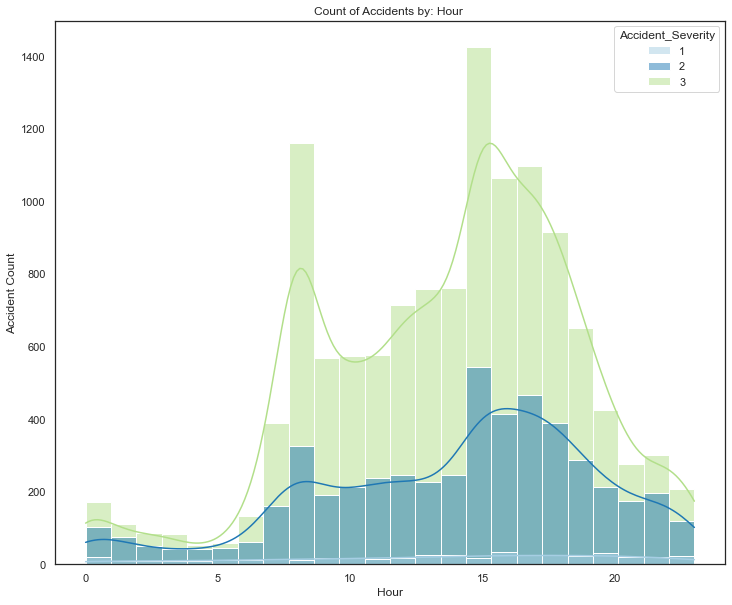

In [84]:
#Visualise accident occurrence by time of the day and severity
Histplot(pedestrians, 'Hour', color = "lightgreen")

- We can see from the plot that pedestrian accidents happen most around 3pm with occurrences significantly at 11%.
- The frequency of pedestrian accidents is also observed to be high at 8am.

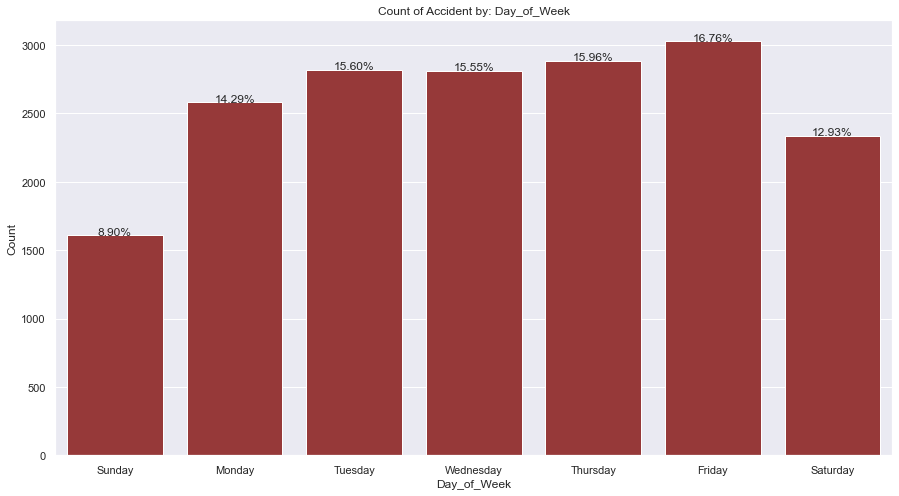

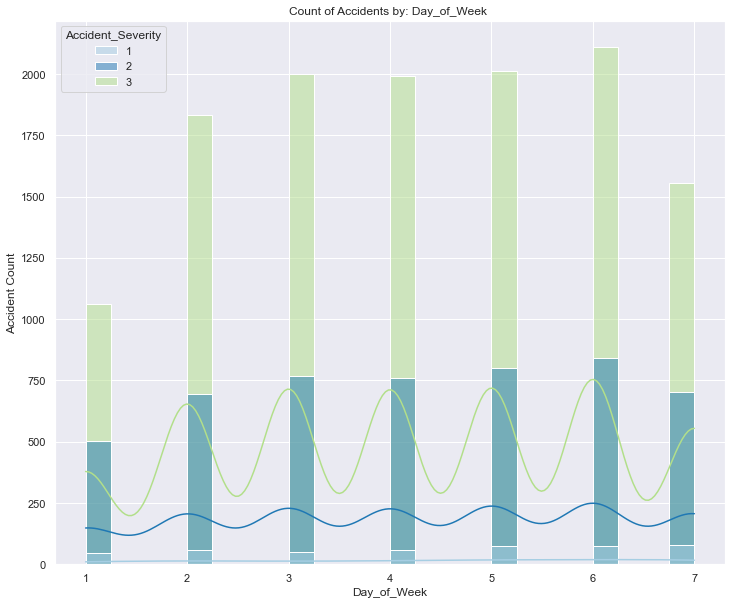

In [85]:
#Visualise accident occurrence by day of the week
Countplot(pedestrians, 'Day_of_Week', color = "brown")
#xticklabels=['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday']
Histplot(pedestrians, 'Day_of_Week', color = "lightgreen")

- The plot above shows there were more pedestrian casualties on Fridays than any other day of the week.

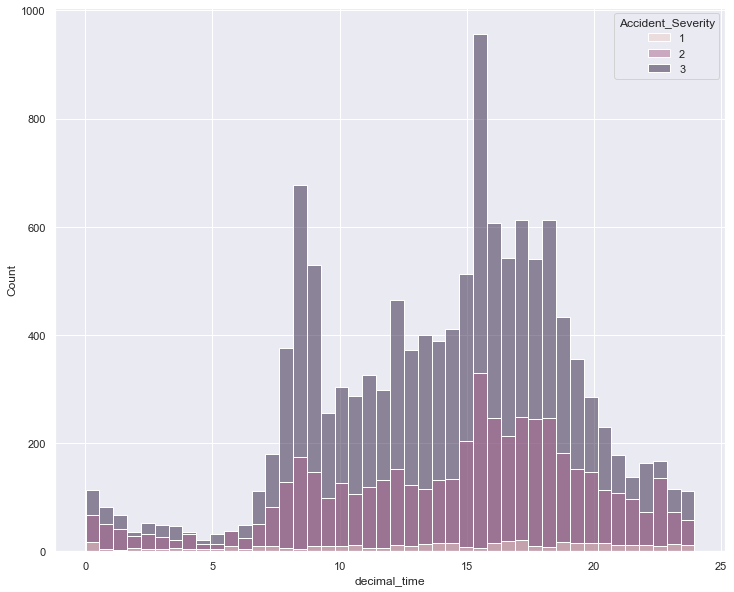

In [86]:
#Digging deeper into friday to determine the time most pedestrian accidents occur
friday_ped=pedestrians[pedestrians['Day_of_Week']==6]
plt.figure(figsize=(12,10))
sns.histplot(x ='decimal_time',data = pedestrians,hue = 'Accident_Severity');

In [87]:
pedestrians['decimal_time'].mode()

0    15.5
Name: decimal_time, dtype: float64

- The above plot reveals that on fridays, pedestrian accidents occurred most at about 3.30pm. The accidents are however rarely severe with most recorded being of slight severity

- (d) What impact, if any does daylight savings have on road traffic accidents in the week after it starts and stops?

- To determine the impact of daylight savings, we'll calculate the total number of accidents that occurred in the months that have daylight savings against the months of standard time.

- Daylight savings in the UK begins on the last Sunday of March and ends on the last Sunday of October (Kountouris, 2020).
For the year 2019 daylight savings started on Sunday 31 March 2019 and ended Sunday 27 October 2019.

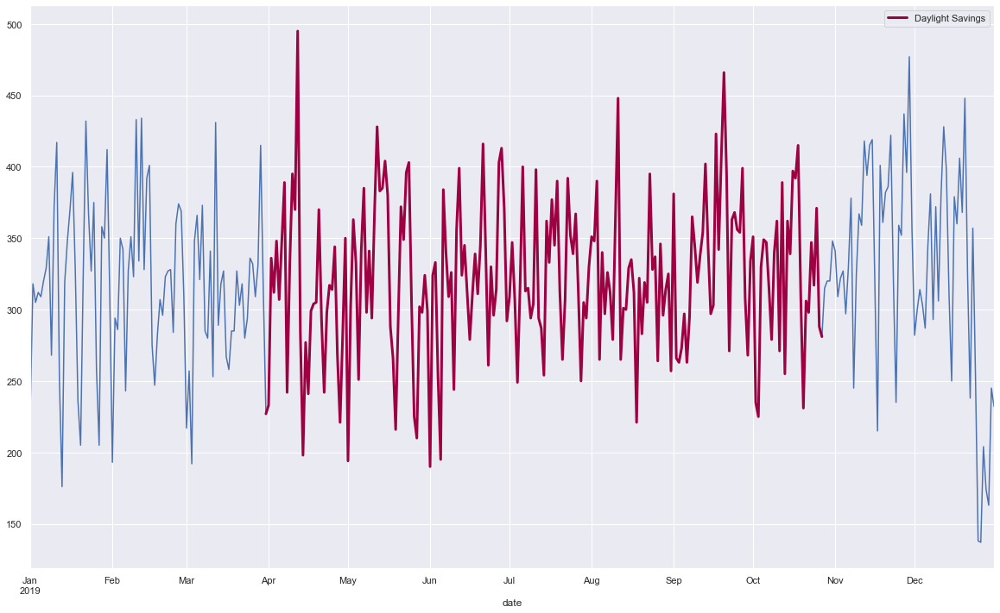

In [88]:
df_DA.groupby(['date'])['Accident_Index'].count().plot(legend = False)
##Dayligt saving period
df_DA.loc[df_DA.date.between('2019-03-31', '2019-10-27')].groupby(['date'])['Accident_Index'].count().plot(legend = True, cmap= plt.cm.Spectral,label = 'Daylight Savings', figsize=(20,12), linewidth = 3) 
plt.show()

- The plot above shows there are more accidents in the week after daylight savings begin than the week after daylight savings ends.

- We shall however put this into hypothesis testing

In [89]:
import statistics as stats

In [90]:
week_after_start = df_DA.loc[df_DA.date.between('2019-04-01', '2019-04-07')].groupby(['date'])['Accident_Index'].count().values
week_after_start

array([233, 336, 312, 348, 307, 348, 389], dtype=int64)

In [91]:
week_after_stop = df_DA.loc[df_DA.date.between('2019-10-28', '2019-11-03')].groupby(['date'])['Accident_Index'].count().values
week_after_stop

array([315, 320, 320, 348, 341, 309, 322], dtype=int64)

In [92]:
from scipy import stats, optimize, interpolate
stats.ttest_rel(week_after_start, week_after_stop)

Ttest_relResult(statistic=-0.015533463248284144, pvalue=0.9881102269256239)

- The test yields a p-value of 0.9881 which means there's a 98% chance 

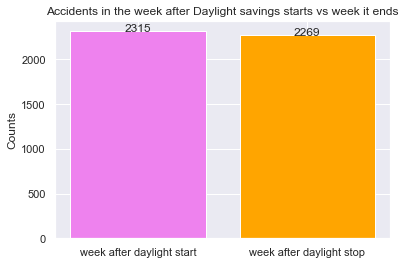

In [93]:
#Accidents in the week after daylight savings start and the week after it ends
week_after_start = len(df_DA[df_DA['Week']==15])
week_after_stop = len(df_DA[df_DA['Week']==45])

label = ['week after daylight start', 'week after daylight stop']
count = [week_after_start,week_after_stop]

for x in range(len(label)):
         plt.text(x, count[x], count[x], ha = 'center')

plt.bar(label,count, color = ['violet', 'orange']) 
plt.title('Accidents in the week after Daylight savings starts vs week it ends')
plt.ylabel('Counts')
plt.show()

- More road accidents were recorded in the week after daylight savings began than the week after it stopped.

- (e) What impact, if any does sunrise and sunset times have on road traffic accidents

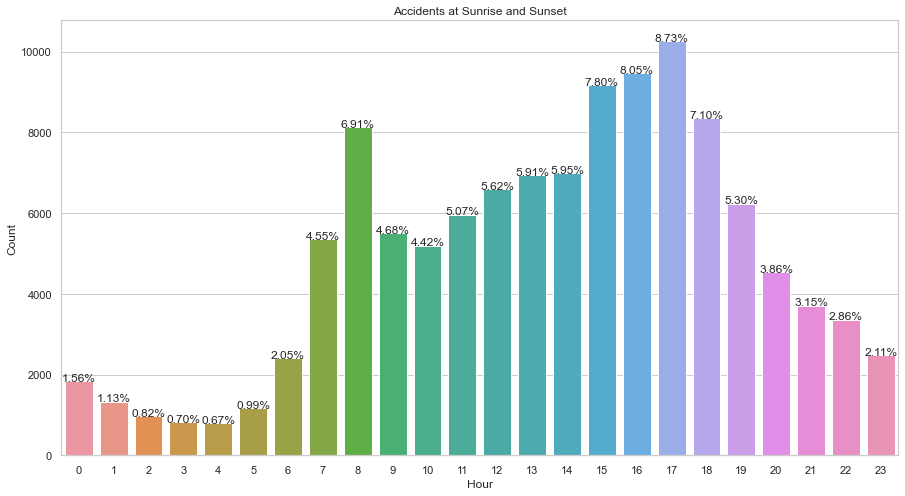

In [94]:
#Visualize sunrise and sunset accident occurrences: hour
sns.set(style="whitegrid")
plt.figure(figsize=(15,8))
Sunrise_sunsetplot = sns.countplot(x='Hour',data=df_DA)
Sunrise_sunsetplot.set(xlabel='Hour', ylabel='Count')
for p in Sunrise_sunsetplot.patches: 
    height = p.get_height() 
    Sunrise_sunsetplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(time_acc))*100)+'%',  
      ha="center") 
plt.title('Accidents at Sunrise and Sunset')
plt.show()

- We can infer from the above that more road accidents occur around sunset than at sunrise.

- (f)Are there particular types of vehicles(engine capacity, age of vehicle, etc) that are more frequently involved in road traffic accidents?

In [95]:
#Let us map Vehicle type to categorical
def class_of_vehicle(row):
    if row['Vehicle_Type']==2 or row['Vehicle_Type']==3 or row['Vehicle_Type']==4 or row['Vehicle_Type']==5 or row['Vehicle_Type']==97 or row['Vehicle_Type']==23:
        return 'Motorcycle'
    if row['Vehicle_Type']== 8  or row['Vehicle_Type']==  9:
        return 'Car'
    if row['Vehicle_Type'] == 10 or row['Vehicle_Type']==11:
        return 'Bus'
    if row['Vehicle_Type']== 19 or row['Vehicle_Type']==20 or row['Vehicle_Type']==21 or row['Vehicle_Type']==98:
        return 'Van'
    else:
        return 'Other Vehicles'

In [96]:
df_DV['Vehicle Class'] = df_DV.apply (class_of_vehicle, axis = 1 )

In [97]:
#We can define a function to plot frequency histograms of the features
def Histogram(data, var, color = "orange"):
    sns.histplot(data = data, x = var, color = color)
    plt.title(f"Histogram: {var}")
    plt.xlabel(f"{var}")
    plt.ylabel("Frequency");
    
    

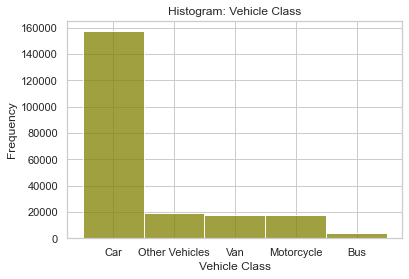

In [98]:
#Display vehicle types
Histogram(df_DV, 'Vehicle Class', color = "olive");

- It is quite obvious from the plot that cars accounted for the majority of accidents(about 158,000). Motorcycles, Vans and other vehicles each recorded between 19,000 and 20,000 accidents while buses were the least (about 4,000) involved in road mishaps in the year.

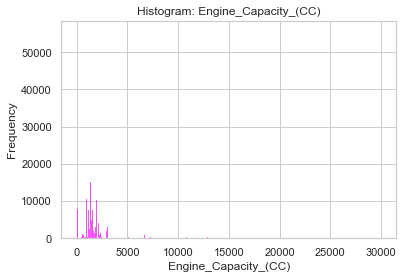

In [99]:
#Display "Engine capacity"
Histogram(df_DV, "Engine_Capacity_(CC)", color = "fuchsia")

- Vehicles with engine capacity about 1,400(CC) were the most involved in road accidents

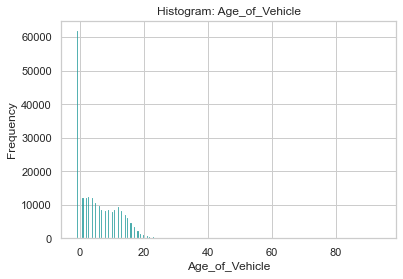

In [100]:
#Display "Age of Vehicle"

Histogram(df_DV, "Age_of_Vehicle", color = "darkcyan")


- We can infer from the above plot that older vehicles are the least prone or least frequently involved in accidents. Newer cars were more frequently involved in accidents.

- (g)Are there particular conditions (weather, geographic location, situations) that generate more road traffic accidents?

- WEATHER CONDITIONS

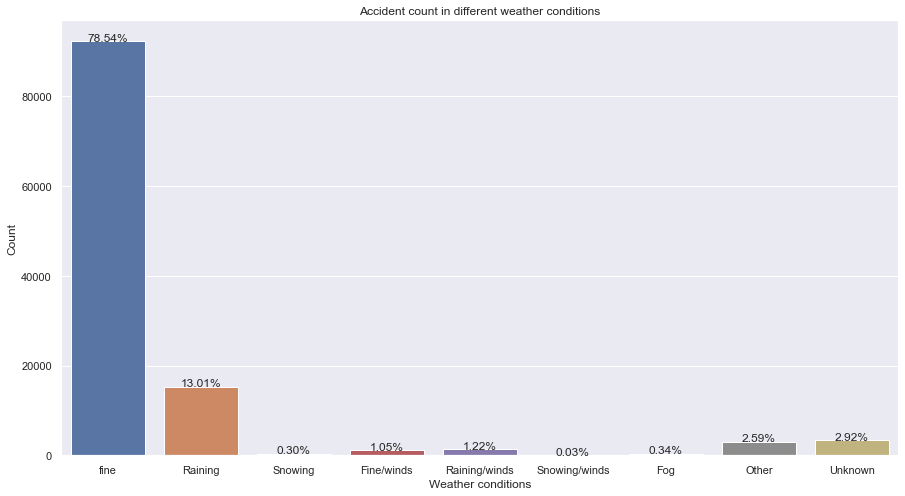

In [101]:
sns.set(style="darkgrid")
plt.figure(figsize=(15,8))
weatherplot = sns.countplot(x='Weather_Conditions',data=df_DA)
weatherplot.set(xlabel='Weather conditions', ylabel='Count',xticklabels=['fine','Raining','Snowing','Fine/winds',
                                                                         'Raining/winds','Snowing/winds','Fog','Other','Unknown'])
for p in weatherplot.patches: 
    height = p.get_height() 
    weatherplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(time_acc))*100)+'%',  
      ha="center") 
plt.title('Accident count in different weather conditions')
plt.show()

- The above plot shows that weather conditions were at its finest when most(78%) of accidents occurred.

- GEOGRAPHIC LOCATIONS

In [102]:
#Map Police Location codes to Categorical
def Name_of_City(x):
    if x == 1:
        return 'Metropolitan'
    elif x == 3:
        return 'Cumbria'
    elif x == 4:
        return 'Lancashire'
    elif x == 5:
        return 'Merseyside'
    elif x == 6:
        return 'Greater Manchester'
    elif x == 7:
        return 'Cheshire'
    elif x == 10:
        return 'Northumbria'
    elif x == 11:
        return 'Durham'
    elif x == 12:
        return 'North Yorkshire'
    elif x == 13:
        return 'West Yorkshire'
    elif x == 14:
        return 'South Yorkshire'
    elif x == 16:
        return 'Humberside'
    elif x == 17:
        return 'Cleveland'
    elif x == 20:
        return 'West Midlands'
    elif x == 21:
        return 'Staffordshire'
    elif x == 22:
        return 'West Mercia'
    elif x == 23:
        return 'Warwickshire'
    elif x == 30:
        return 'Derbyshire'
    elif x == 31:
        return 'Nottinghamshire'
    elif x == 32:
        return 'Lincolnshire'
    elif x == 33:
        return 'Leicestershire'
    elif x == 34:
        return 'Northamptonshire'
    elif x == 35:
        return 'Cambridgeshire'
    elif x == 36:
        return 'Norfolk'
    elif x == 37:
        return 'Suffolk'
    elif x == 40:
        return 'Bedfordshire'
    elif x == 41:
        return 'Hertfordshire'
    elif x == 42:
        return 'Essex'
    elif x == 43:
        return 'Thames Valley'
    elif x == 44:
        return 'Hampshire'
    elif x == 45:
        return 'Surrey'
    elif x == 46:
        return 'Kent'
    elif x == 47:
        return 'Sussex'
    elif x == 48:
        return 'City of London'
    elif x == 50:
        return 'Devon and Cornwall'
    elif x == 52:
        return 'Avon and Somerset'
    elif x == 53:
        return 'Gloucestershire'
    elif x == 54:
        return 'Wiltshire'
    elif x == 55:
        return 'Dorset'
    elif x == 60:
        return 'North Wales'
    elif x == 61:
        return 'Gwent'
    elif x == 62:
        return 'South Wales'
    elif x == 63:
        return ' Dyfed-Powys'
    elif x == 91:
        return 'Northern'
    elif x == 92:
        return 'Grampian'
    elif x == 93:
        return 'Tayside'
    elif x == 94:
        return 'Fife'
    elif x == 95:
        return 'Lothian and Borders'
    elif x == 96:
        return 'Central'
    elif x == 97:
        return 'Strathclyde'
    else:
        return 'Dumfries and Galloway'

In [103]:
df_DA['Location'] = df_DA['Police_Force'].apply(lambda x : Name_of_City(x))

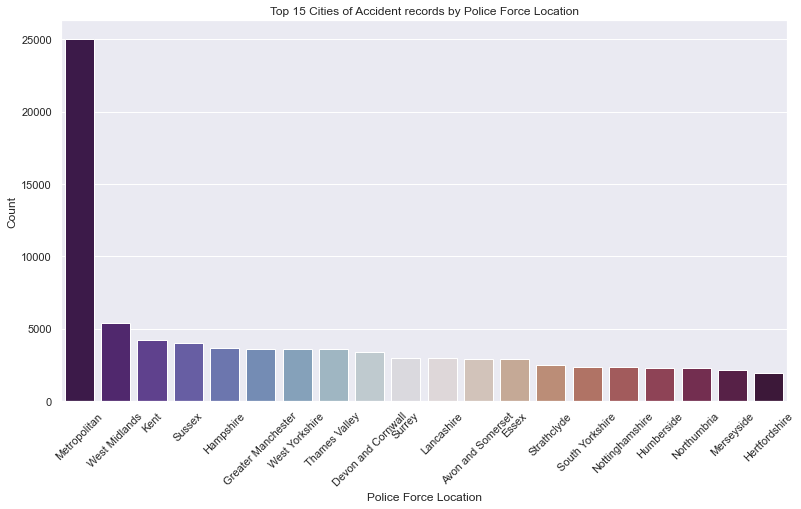

In [104]:
#Top 15 Accident Locations by Police Force Location
hotspot= df_DA["Location"].value_counts()
fig,axs= plt.subplots(figsize=(13,7))
sns.countplot(x="Location",order= hotspot.index[:20],data= df_DA,palette= 'twilight_shifted')
plt.ylabel('Count')
plt.xlabel('Police Force Location')
plt.xticks(rotation=45)
plt.title('Top 15 Cities of Accident records by Police Force Location')
plt.show()

- We can infer from the plot that the Metropolitan Police recorded the most (about 25,000) road accidents in 2019, with West Midlands recording the next highest(about 5,500).

In [105]:
df_map = df_DA[['Location','Latitude','Longitude']]

In [106]:
#using geopandas to convert Long  and Lat to points
geometry = gpd.points_from_xy(df_map.Longitude, df_map.Latitude)
df_geo = gpd.GeoDataFrame(df_map[['Latitude', 'Longitude']], geometry = geometry)


In [107]:
#get built in dataset fromgeopandas
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

In [108]:
import matplotlib
import matplotlib.pyplot as plt

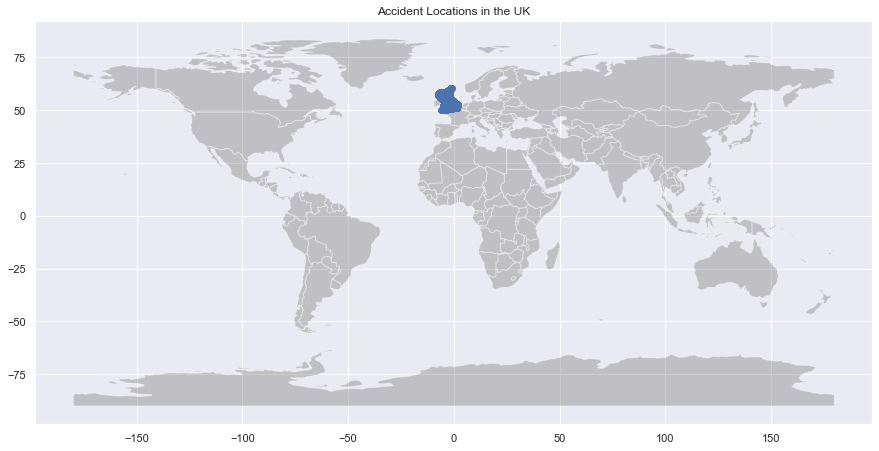

In [109]:
fig, ax = plt.subplots(figsize=(15,10))
world.plot(ax=ax, alpha=0.4, color='grey')
df_geo.plot(ax=ax, legend=True)
plt.title('Accident Locations in the UK');

# K Means clustering for Locations

In [110]:
from sklearn.cluster import KMeans
from sklearn.cluster import OPTICS
from sklearn.cluster import DBSCAN

In [111]:
df_location = df_DA[['Latitude','Longitude']]

In [112]:
flow = []

In [113]:
K = range(5,25)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(df_location)
    flow.append(kmeanModel.inertia_)

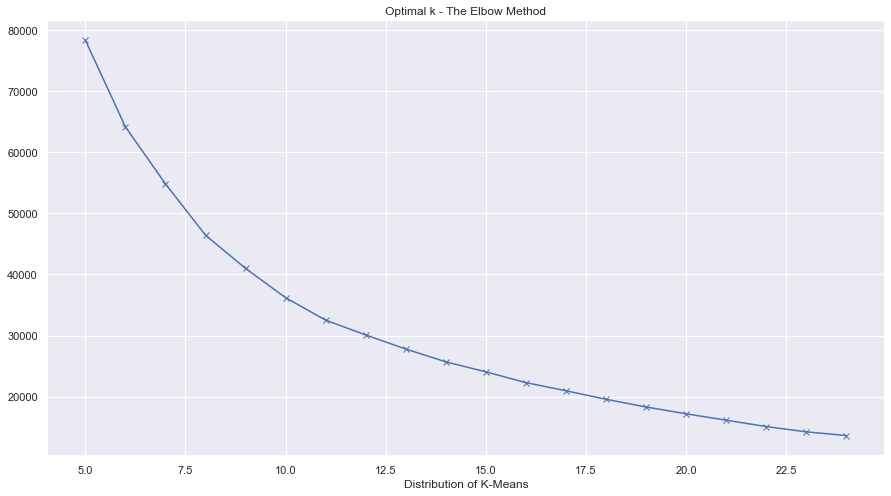

In [114]:
#We plot the distribution of K-Means
plt.figure(figsize=(15,8))
plt.plot(K, flow, 'bx-')
plt.xlabel('k')
plt.xlabel('Distribution of K-Means')
plt.title('Optimal k - The Elbow Method')
plt.show()

In [115]:
kmeans = KMeans(n_clusters = 11)

In [116]:
kmeans.fit(df_location)

KMeans(n_clusters=11)

In [117]:
labels = kmeans.fit_predict(df_location)

In [118]:
labels

array([0, 0, 0, ..., 4, 4, 4])

In [119]:
centroids = kmeans.cluster_centers_

In [120]:
centroids

array([[51.49676111, -0.14915459],
       [54.84026856, -1.60733141],
       [52.50188352, -1.74324215],
       [53.51937691, -2.67947319],
       [56.11460687, -3.7864934 ],
       [50.86950836, -4.21267315],
       [53.24563794, -0.3148781 ],
       [51.12960533, -1.30648192],
       [51.46314325, -2.79380024],
       [51.83060872,  0.92222528],
       [53.50003513, -1.41256303]])

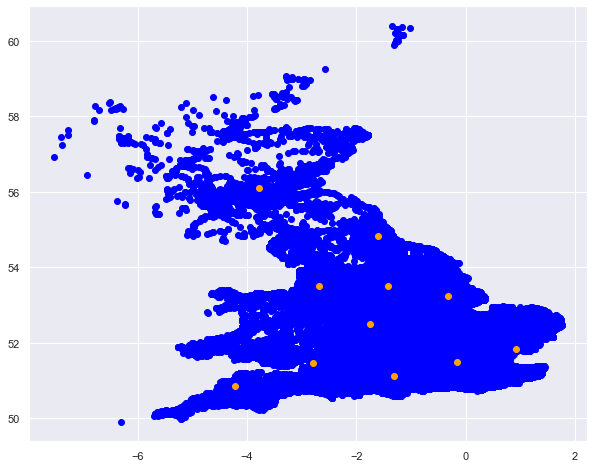

In [121]:
fig = plt.figure(figsize = (10,8))
colors = map(lambda x : colmap[x+1], labels)
plt.scatter(x = df_location['Longitude'], y = df_location['Latitude'], color = 'blue')
plt.scatter(centroids[:,1], centroids[:,0], color = 'orange')
plt.show()

In [122]:
centroids = kmeanModel.cluster_centers_

In [123]:
df_location = np.round(df_location, decimals=2) #round coordinates to 2 decimal places
df_location = df_location.groupby(['Longitude', 'Latitude']).size().reset_index(name='counts') #group same coordinates together
print(df_location.head()) #show data

   Longitude  Latitude  counts
0      -7.53     56.94       1
1      -7.39     57.46       1
2      -7.38     57.25       1
3      -7.28     57.64       1
4      -7.27     57.50       1


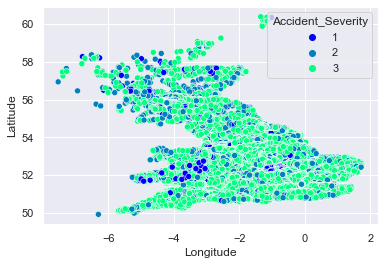

In [124]:
# plt.figure(figsize = (20,10))
# plt.subplot(1,2,1)
# sns.scatterplot(data=df_DA, x = "Longitude", y = "Latitude", color = "crimson", alpha = 0.2)

#plt.subplot(1,2,2)
sns.scatterplot(data=df_DA, x = "Longitude", y = "Latitude", hue = "Accident_Severity", palette = "winter")
plt.show()

- SITUATIONS: 
 - Below are events/conditions/situations which affected the number or severity of accidents in 2019 

- EVENTS

- We shall display accidents by months of year 2019 to establish possible events that may have led to more accidents

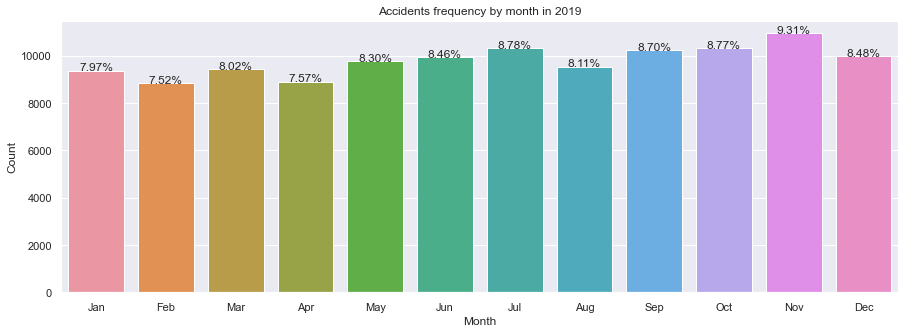

In [125]:
#Visualize accidents in 2019 by months
sns.set(style="darkgrid")
plt.figure(figsize=(15,5))
monthplot = sns.countplot(x='Month',data=time_acc)
monthplot.set(xlabel='Month', ylabel='Count')
for p in monthplot.patches: 
    height = p.get_height() 
    monthplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(time_acc))*100)+'%',  
      ha="center")
monthplot.set(xticklabels=['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])    
plt.title('Accidents frequency by month in 2019')
plt.show()


- It is obvious from the above that more road accidents occurred in November than any other month of 2019.

- Next, we will show the trend of accidents in all the days of November 2019

In [126]:
accidents_Nov = df_DA[(df_DA["Month"] == 11)]

In [127]:
# Let's use a function to show accident occurrences by hour,day and week
def Countplot(data, var, color):
    sns.set(style="darkgrid")
    plt.figure(figsize=(20,12))
    varplot = sns.countplot(x= var,data=data, color = color)
    varplot.set(xlabel='var', ylabel='Count')
    for p in varplot.patches: 
        height = p.get_height() 
        varplot.text(p.get_x()+p.get_width()/2., 
          height + 3, 
          '{:1.2f}'.format((height/len(data))*100)+'%',  
          ha="center") 
    plt.title(f"Count of Accidents in the month by: {var} ")
    plt.xlabel(f"{var}")
    plt.ylabel("Count")

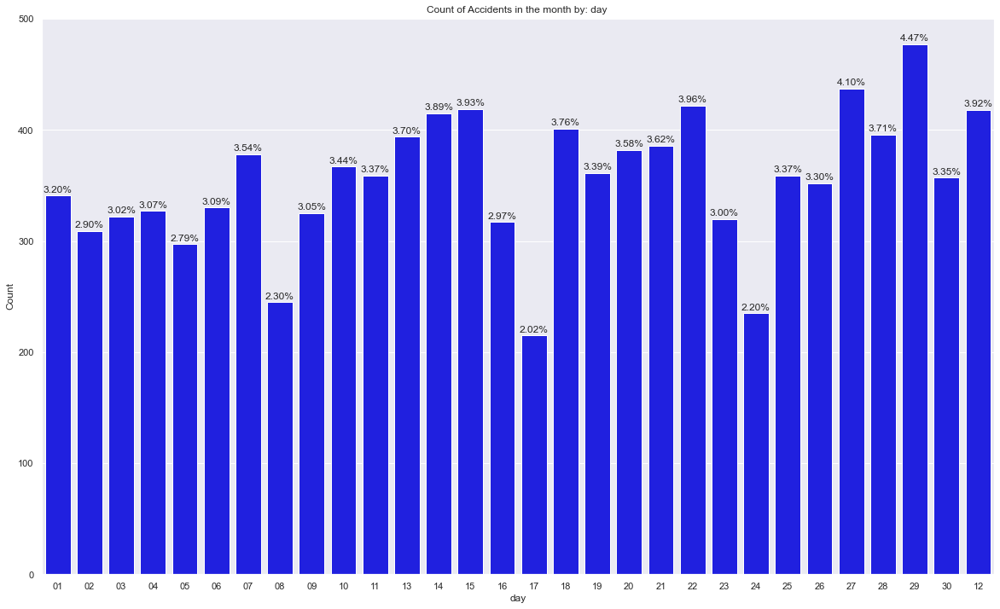

In [128]:
#Let's visualize accidents on all the days of November 2019
Countplot(accidents_Nov, "day", color = "blue");

- It is interesting to see that the highest number of accidents in November was recorded on 29th. In 2019, November 29 was BLACK FRIDAY.

- This supports the assertion that the most important sales period of the year are Black Friday, Christmas and the New Year’s sales events (Ibrahim, N. & Wang, X., 2019).

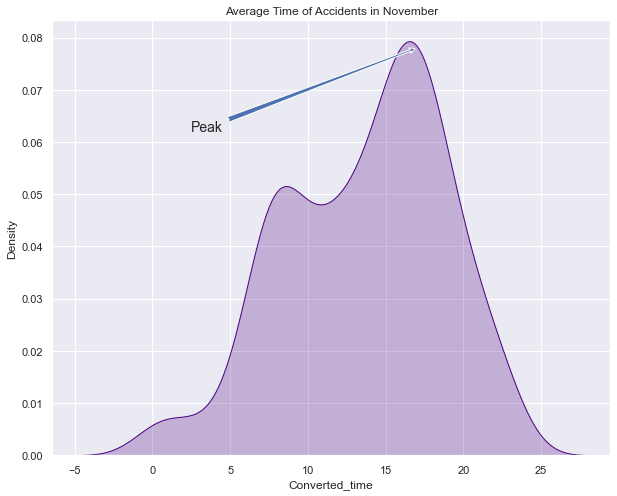

In [129]:
#Visualize time of Accidents
fig,ax = plt.subplots(figsize=(10,8))
sns.kdeplot(accidents_Nov.Converted_time.dt.hour,fill=True,bw_adjust=2,color='indigo',data=accidents_Nov);
plt.annotate('Peak',xy=(17,0.078),xytext=(2.5,0.062),arrowprops={'arrowstyle':'fancy'},fontsize= 14)
plt.title('Average Time of Accidents in November')
plt.show()

- The average time of accidents occurrence in November 2019 was around 17:00 hours.

In [130]:
#Check accidents in december
accidents_Dec = df_DA[(df_DA["Month"] == 12)]

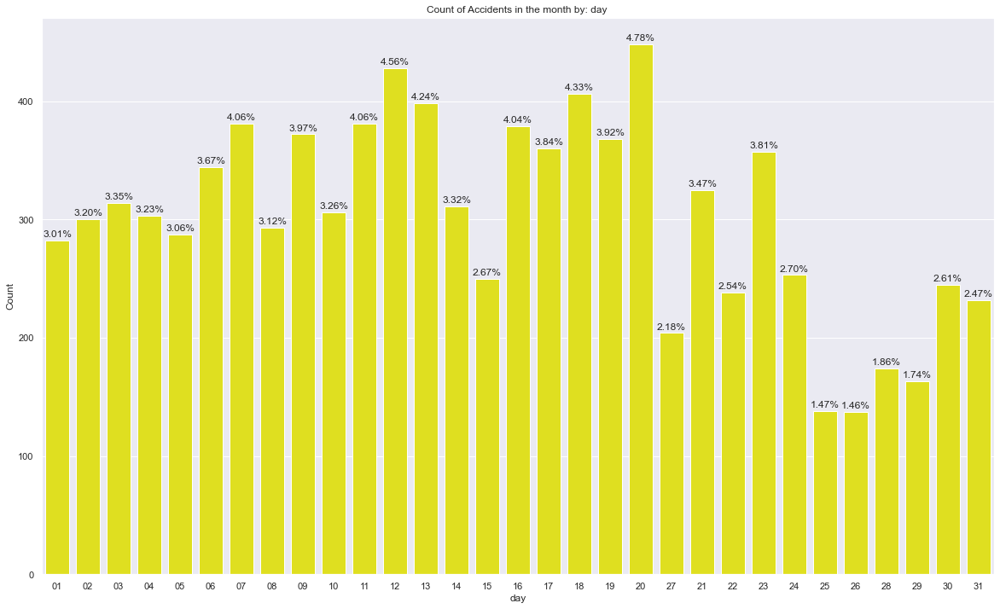

In [131]:
#Let's also visualize count of accidents on all days of December 2019
Countplot(accidents_Dec, "day", color = "yellow")

- According to the above plot, the highest number of accidents in December 2019 was recorded on the 20th. 
- This was the last Friday before Christmas in 2019, it is believed that most people would have been in the last rush for the yuletide shopping.

- LIGHT CONDITIONS

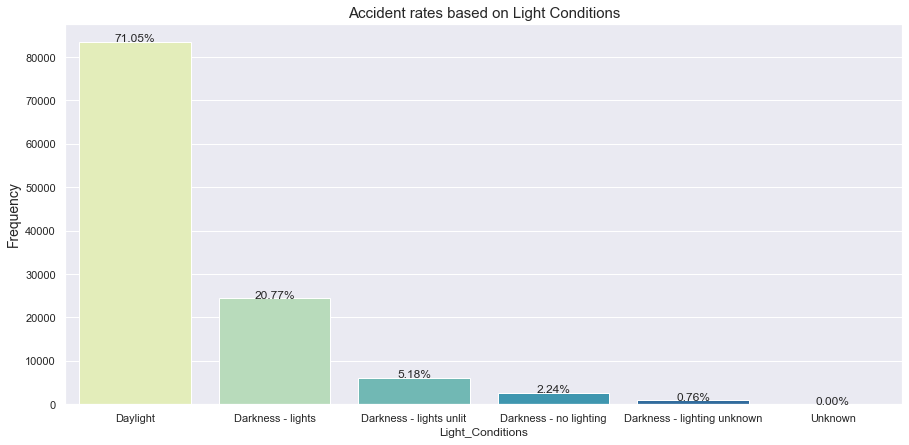

In [132]:
plt.figure(figsize=(15,7))
lightplot=sns.countplot('Light_Conditions',data=df_DA,
                 order = df_DA["Light_Conditions"].value_counts().index,
                 palette = "YlGnBu") 
lightplot.set_xticklabels(['Daylight','Darkness - lights','Darkness - lights unlit','Darkness - no lighting',
                    'Darkness - lighting unknown','Unknown'])

plt.title('Accident rates based on Light Conditions',fontsize=15)
plt.ylabel("Frequency", fontsize = 14)
for p in lightplot.patches: 
    height = p.get_height() 
    lightplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(time_acc))*100)+'%',  
      ha="center") 

plt.show()

- It is clear from the above that majority(71%) of the accidents recorded in 2019 occurred in Daylight

- ROAD SURFACE CONDITIONS

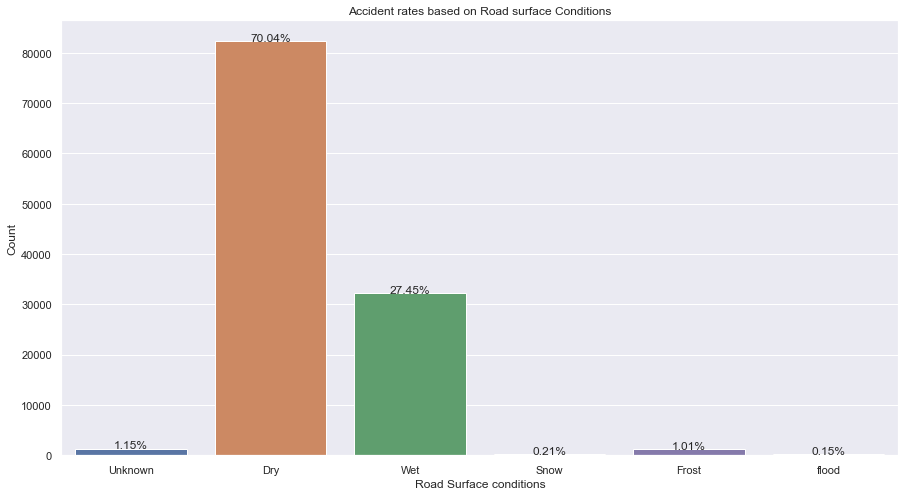

In [133]:
sns.set(style="darkgrid")
plt.figure(figsize=(15,8))
roadplot = sns.countplot(x='Road_Surface_Conditions',data=df_DA)
roadplot.set(xlabel='Road Surface conditions', ylabel='Count',xticklabels=['Unknown','Dry','Wet','Snow','Frost','flood'])
for p in roadplot.patches: 
    height = p.get_height() 
    roadplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(time_acc))*100)+'%',  
      ha="center") 
plt.title('Accident rates based on Road surface Conditions')
plt.show()

- It is apparent from the above plot that dry road surface conditions accounted for most (70%) road accidents in the year while about 27% of road accidents happened on wet road surfaces.

- ACCIDENTS BY ROAD TYPE

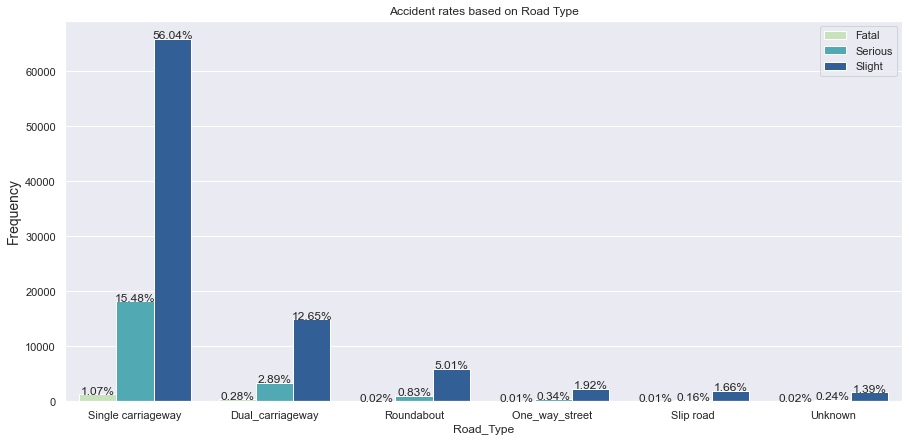

In [134]:
plt.figure(figsize=(15,7))
axplot = sns.countplot('Road_Type',hue='Accident_Severity',data=df_DA, 
                   order = df_DA["Road_Type"].value_counts().index, palette = "YlGnBu")
axplot.set_xticklabels(['Single carriageway','Dual_carriageway','Roundabout',
                    'One_way_street ',
                    'Slip road','Unknown'])
plt.legend(['Fatal','Serious','Slight'])
plt.ylabel("Frequency", fontsize = 14)
for p in axplot.patches: 
    height = p.get_height() 
    axplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(time_acc))*100)+'%',  
      ha="center") 
plt.title('Accident rates based on Road Type')
plt.show()

- We can infer from the above that Single carriageways are the most prone to accidents. it is worthy of note that nearly all fatal accidents recorded happened on single carriageways.

- VEHICLE MANOEUVRE

In [135]:
#removing the bottom least figures and (-1)
manoeuvre = df_DV
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != -1]
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != 8]
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != 15]
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != 11]
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != 12]
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != 6]
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != 14]
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != 1]
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != 10]
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != 13]

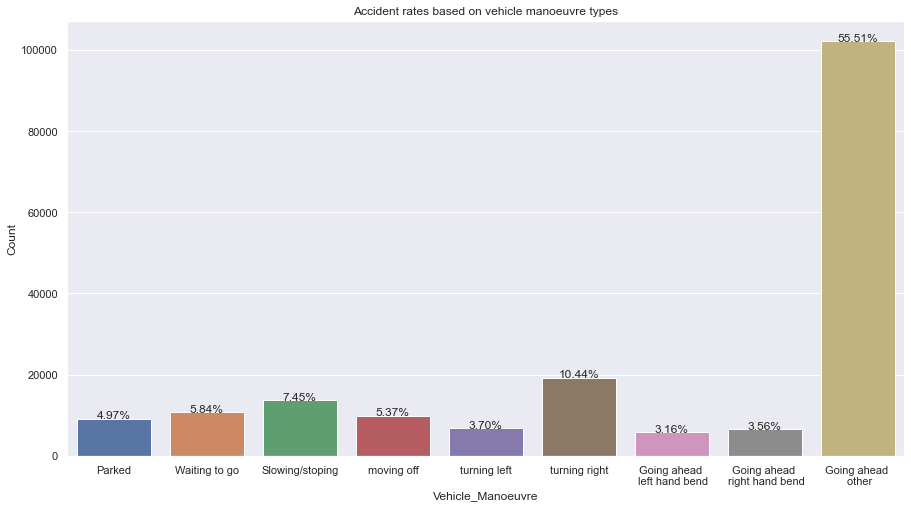

In [136]:
plt.figure(figsize=(15,8))

vehicle_manoeuvreplot = sns.countplot(x='Vehicle_Manoeuvre',data=manoeuvre)
vehicle_manoeuvreplot.set(xlabel='Vehicle_Manoeuvre',ylabel='Count',xticklabels=['Parked','Waiting to go','Slowing/stoping','moving off','turning left','turning right','Going ahead \n left hand bend','Going ahead \n right hand bend','Going ahead \n other'])
for p in vehicle_manoeuvreplot.patches: 
    height = p.get_height() 
    vehicle_manoeuvreplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(manoeuvre))*100)+'%',  
      ha="center") 
plt.title('Accident rates based on vehicle manoeuvre types')
plt.show()

- It seems from the above that in terms of vehicle manoeuvre, most accidents occurred with vehicle going ahead of other.

- SPEED LIMIT

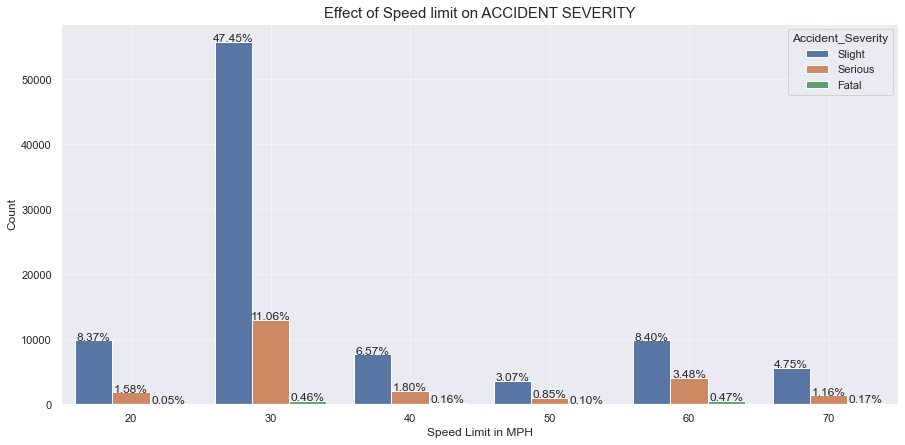

In [137]:
speedlimit = df_DA[df_DA['Speed_limit']>0]
speedlimit['Accident_Severity'] = speedlimit['Accident_Severity'].replace([1,2,3], ['Fatal','Serious','Slight'])
plt.figure(figsize=(15,7))
speedlimitplot=sns.countplot(x= 'Speed_limit', hue='Accident_Severity', data = speedlimit)
plt.title('Effect of Speed limit on ACCIDENT SEVERITY', fontsize=15)
speedlimitplot.set(xlabel='Speed Limit in MPH', ylabel = 'Count')
#axplot.set_xticklabels(['fatal','serious','slight'])
for p in speedlimitplot.patches: 
    height = p.get_height() 
    speedlimitplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(df_DA))*100)+'%',  
      ha="center") 
plt.grid(alpha=0.4)
plt.show()

- More than half of the total road accidents in 2019 occurred at 30mph, they were majorly slight. The highest number of fatal accidents were recorded at 30mph and 60 mph.

- The largest count of serious accidents were also recorded at 30mph

- (h) How does driver related variables affect the outcome (e.g. age of driver, and the purpose of the journey)?

- AGE OF DRIVER

In [138]:
#We shall map the age band and change to categorical
def map_age(age):
    if age == 1:
        return '0-5'
    elif age == 2:
        return '6-10'
    elif age == 3:
        return '11-15'
    elif age == 4:
        return '16-20'
    elif age == 5:
        return '21-25'
    elif age == 6:
        return '26-35'
    elif age == 7:
        return '36-45'
    elif age == 8:
        return '46-55'
    elif age == 9:
        return '56-65'
    elif age == 10:
        return '66-75'
    else:
        if age == 11:
            return "over 75"
    

df_DV['Age_Band_of_Driver'] = df_DV['Age_Band_of_Driver'].apply(map_age)

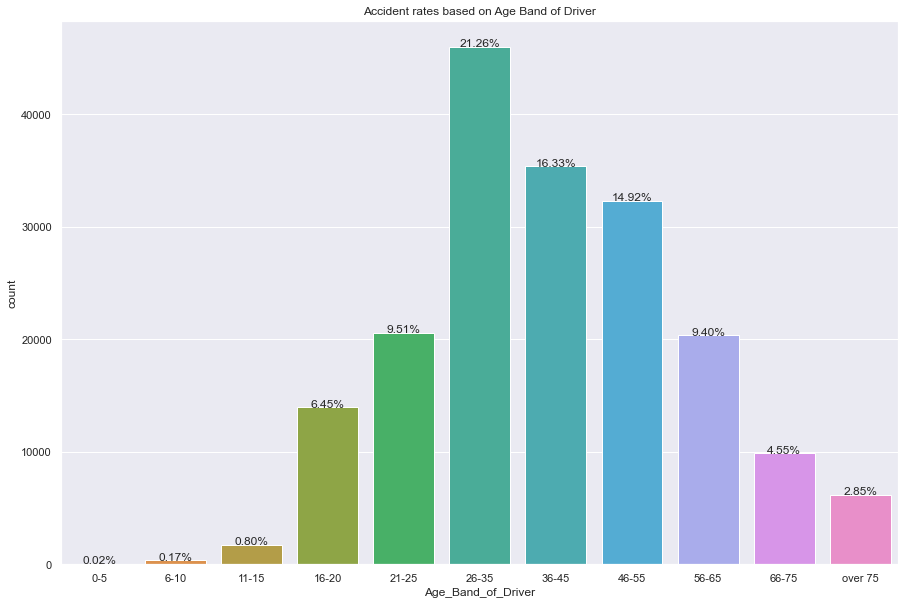

In [139]:
sns.set(style="darkgrid")
plt.figure(figsize=(15,10))
ageplot=sns.countplot(x='Age_Band_of_Driver',data=df_DV,order=['0-5','6-10','11-15','16-20','21-25','26-35','36-45','46-55','56-65','66-75','over 75'])
for p in ageplot.patches: 
    height = p.get_height() 
    ageplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(df_DV))*100)+'%',  
      ha="center") 
plt.title('Accident rates based on Age Band of Driver');

- The largest number of accidents were recorded from vehicles driven by individuals in the age band 26 - 35 years old.

- SEX OF DRIVER

In [140]:
#Change the variable into categorical
def map_sex(sex):
    if sex == 1:
        return 'Male'
    elif sex == 2:
        return 'Female'

df_DV['Sex_of_Driver'] = df_DV['Sex_of_Driver'].apply(map_sex)

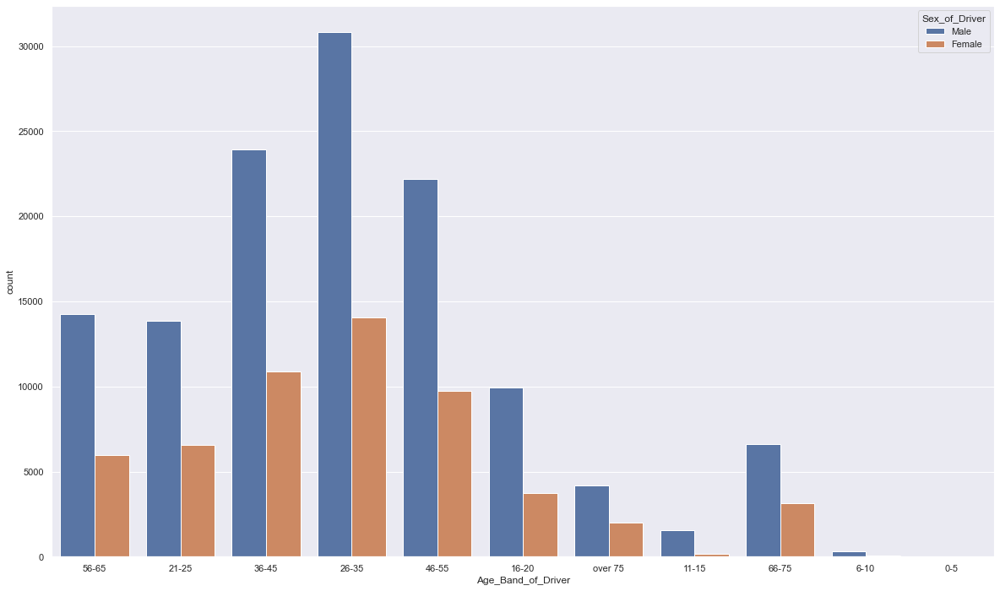

In [141]:
plt.figure(figsize = (20,12))
sns.countplot(x=df_DV['Age_Band_of_Driver'], hue= df_DV['Sex_of_Driver'])
plt.show()


- We can also infer from the above that more male drivers were involved in accidents than female drivers.

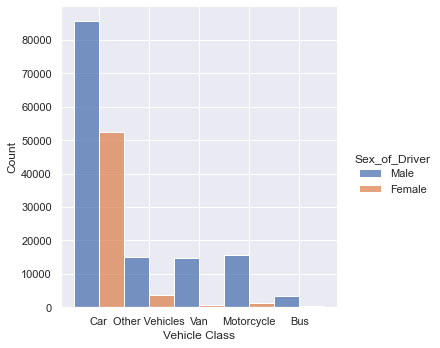

In [142]:
#Show relationship between Vehicle type and sex of driver 
sns.displot(x=df_DV['Vehicle Class'], hue= df_DV['Sex_of_Driver'], multiple= 'dodge')

- Cars driven by males accounted for the majority of accidents as seen from the above plot.

- PURPOSE OF THE JOURNEY

In [143]:
#Map Journey Purpose of Driver to categorical
def purpose_of_journey(row):
    if row['Journey_Purpose_of_Driver']== 1 or row['Journey_Purpose_of_Driver']== 2:
        return 'Work Related'
    if row['Journey_Purpose_of_Driver']== 3 or row['Journey_Purpose_of_Driver']== 4:
        return 'School Related'
    if row['Journey_Purpose_of_Driver']== 6:
        return 'Unknown'    
    else:
        return 'Other Purposes'
    

In [144]:
df_DV['Journey Purpose']= df_DV.apply(purpose_of_journey, axis = 1)

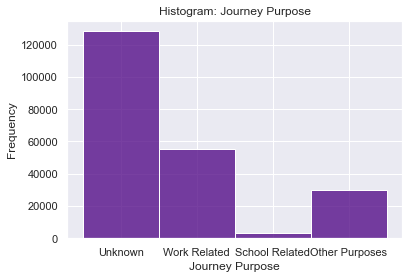

In [145]:
#Display Purpose of Journey
Histogram(df_DV, 'Journey Purpose', color = "indigo")

- We can infer from the above that journey purposes other than work or school related resulted in the majority(about 72%) of accidents in 2019.

- SEVERITY OF CASUALTIES

In [146]:
#Check the values of the severity variable
df_DC['Casualty_Severity'].value_counts()

3    125461
2     25945
1      1752
Name: Casualty_Severity, dtype: int64

In [147]:
# We shall map the variable and change to categorical
def map_severity(severity):
    if severity == 1:
        return 'Fatal'
    elif severity == 2:
        return 'Serious'
    elif severity == 3:
        return 'Slight'
    
df_DC['Casualty_Severity'] = df_DC['Casualty_Severity'].apply(map_severity)

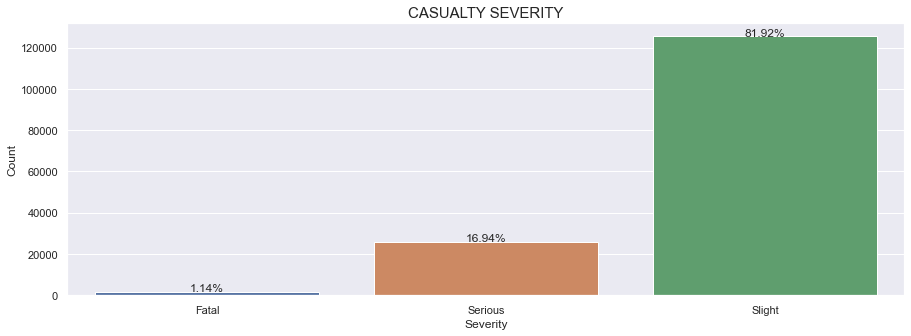

In [148]:
sns.set(style="darkgrid")
plt.figure(figsize=(15,5))
severityplot = sns.countplot(x='Casualty_Severity',data=df_DC,order=['Fatal','Serious','Slight'])
severityplot.set(xlabel='Severity', ylabel='Count')
for p in severityplot.patches: 
    height = p.get_height() 
    severityplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(df_DC))*100)+'%',  
      ha="center") 
plt.title('CASUALTY SEVERITY', fontsize=15);

- About 82% of the accidents recorded in 2019 had slight casualty injuries, 17% serious and nearly 1% fatal.

- ACCIDENT SEVERITY

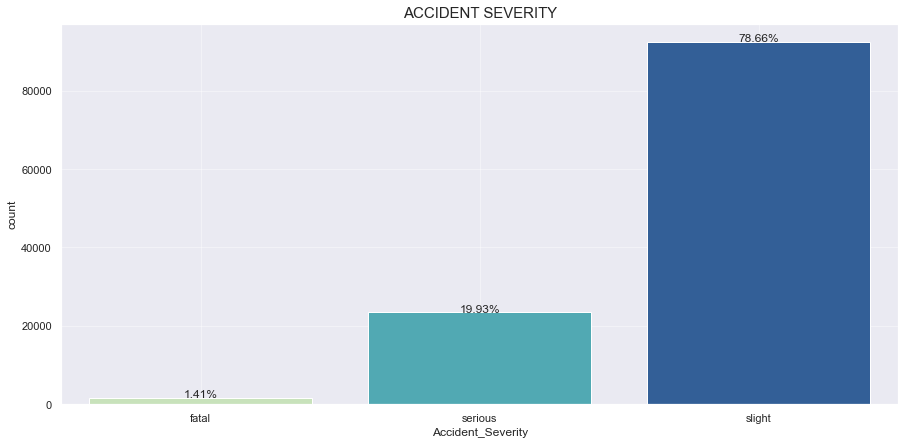

In [149]:
plt.figure(figsize=(15,7))
axplot=sns.countplot(df_DA['Accident_Severity'], palette = "YlGnBu")
plt.title('ACCIDENT SEVERITY', fontsize=15)
axplot.set_xticklabels(['fatal','serious','slight'])
for p in axplot.patches: 
    height = p.get_height() 
    axplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(time_acc))*100)+'%',  
      ha="center") 
plt.grid(alpha=0.4)

- To cut down to the 3 columns we’ve been dealing with so far: accident severity, speed limits, and weather.

# PCA & Feature selection

In [150]:
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, chi2, f_regression, f_classif
from sklearn. model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFECV
from sklearn.model_selection import GridSearchCV

- Rule 1

In [151]:
# Find the association mining parameters
def rule_1():
    
    total =len(df_DA)
    f_A = len(df_DA[df_DA["Speed_limit"]==20])
    f_B = len(df_DA[df_DA["Accident_Severity"]==3])
    f_A_B = len(df_DA[(df_DA["Speed_limit"]==20) & (df_DA["Accident_Severity"]==3)])

    support_A_B = f_A_B/ total
    confidence = f_A_B/ f_A
    completeness = f_A_B/ f_B
    support_A = f_A/ total
    support_B = f_B/ total
    lift = support_A_B/(support_A*support_B)
    conviction = 1 - support_B/(1 - confidence)
    piatetsky_shapiro = f_A_B - (f_A*f_B/ total)

    print("support is: {:.4f}".format(support_A_B))
    print("confidence is: {:.4f}".format(confidence))
    print("completeness is: {:.4f}".format(completeness))
    print("lift is: {:.4f}".format(lift))
    print("conviction is: {:.4f}".format(conviction))
    print("piatetsky_shapiro is: {:.4f}".format(piatetsky_shapiro))
rule_1()

support is: 0.0837
confidence is: 0.8371
completeness is: 0.1064
lift is: 1.0641
conviction is: -3.8278
piatetsky_shapiro is: 592.5917


- Rule 2

In [152]:
# Find the association mining parameters
def rule_2():
    
    total =len(df_DA)
    f_A = len(df_DA[df_DA["Speed_limit"]==70])
    f_B = len(df_DA[df_DA["Accident_Severity"]==1])
    f_A_B = len(df_DA[(df_DA["Speed_limit"]==70) & (df_DA["Accident_Severity"]==1)])

    support_A_B = f_A_B/ total
    confidence = f_A_B/ f_A
    completeness = f_A_B/ f_B
    support_A = f_A/ total
    support_B = f_B/ total
    lift = support_A_B/(support_A*support_B)
    conviction = 1 - support_B/(1 - confidence)
    piatetsky_shapiro = f_A_B - (f_A*f_B/ total)

    print("support is: {:.4f}".format(support_A_B))
    print("confidence is: {:.4f}".format(confidence))
    print("completeness is: {:.4f}".format(completeness))
    print("lift is: {:.4f}".format(lift))
    print("conviction is: {:.4f}".format(conviction))
    print("piatetsky_shapiro is: {:.4f}".format(piatetsky_shapiro))
rule_2()

support is: 0.0017
confidence is: 0.0287
completeness is: 0.1236
lift is: 2.0317
conviction is: 0.9855
piatetsky_shapiro is: 104.0975


- 70 mph zones are relatively safer since it's the highway and these are "no pedestrian zones"

- Which variables (or features) have the most discriminative power to predict fatalities in your opinion? 
- Any thoughts on how this could be investigated?

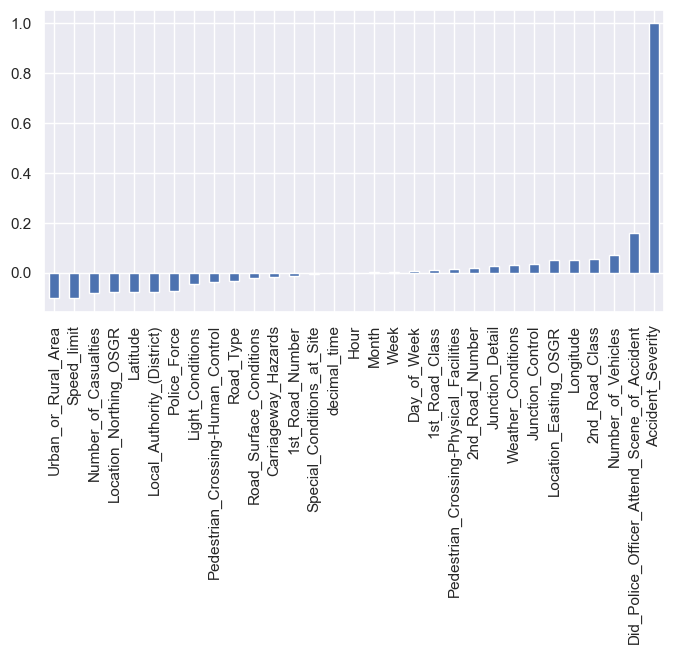

In [153]:
# Correlation 
plt.figure(figsize = (8, 4), dpi = 100)
df_DA.corr()['Accident_Severity'].sort_values().plot(kind  = 'bar');

- The correlation here is poor!

# Speed limits and weather conditions

In [154]:
slwc = df_DA[['Speed_limit', 'Weather_Conditions']]

In [155]:
kmeans1 = KMeans(n_clusters = 12)
kmeans1.fit(slwc)
kmeans1.inertia_

50170.27962789691

In [156]:
labels1 = kmeans1.fit_predict(slwc)

In [157]:
centroids1 = kmeans1.cluster_centers_

In [158]:
slwc.head(5)

,Speed_limit,Weather_Conditions
0,30,1
1,30,1
2,30,1
3,20,1
4,30,1


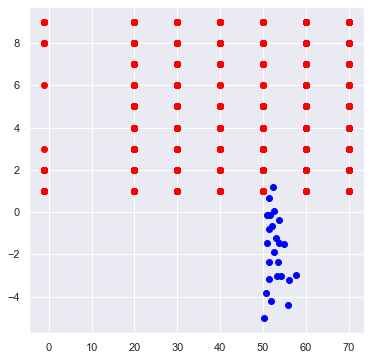

In [159]:
fig = plt.figure(figsize = (6,6))
colors = map(lambda x : colmap[x+1], labels)
plt.scatter(slwc['Speed_limit'], slwc['Weather_Conditions'], color = 'red')

plt.scatter(centroids[:,0], centroids[:,1], color = 'blue')
plt.show()

# K Best Method - Accident file

- Now let’s see what the top N conditions are for our target variable (i.e., accident severity).

- The above plot shows that Speed_limit, Light_Conditions and number of Vehicles are the main factors out of the ones that we have looked at. 

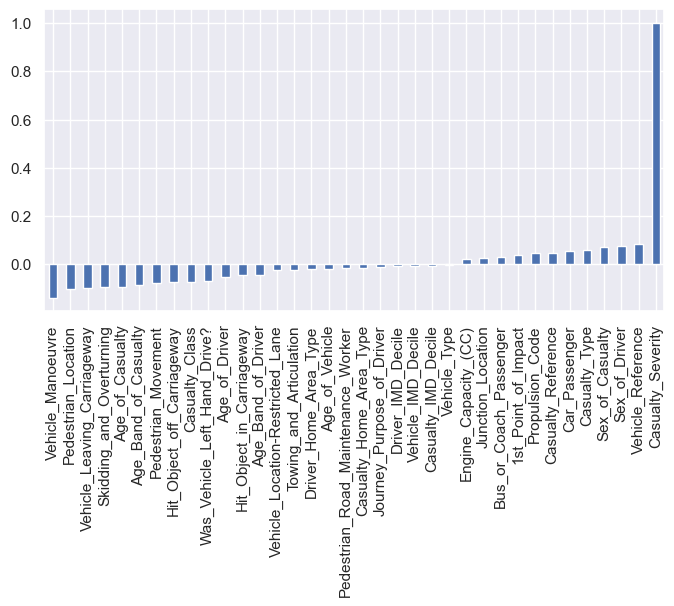

In [160]:
# Correlation 
plt.figure(figsize = (8, 4), dpi = 100)
df_CV.corr()['Casualty_Severity'].sort_values().plot(kind  = 'bar');

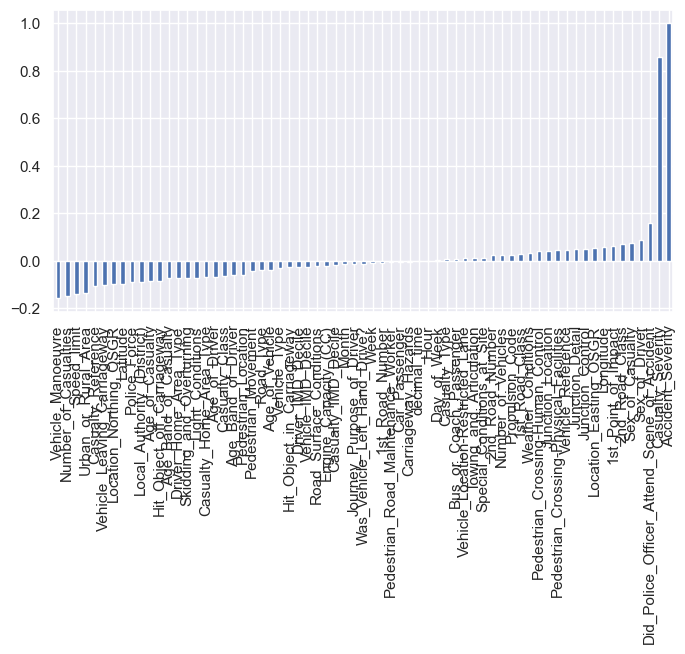

In [161]:
# Correlation 
plt.figure(figsize = (8, 4), dpi = 100)
df_ACV.corr()['Accident_Severity'].sort_values().plot(kind  = 'bar');

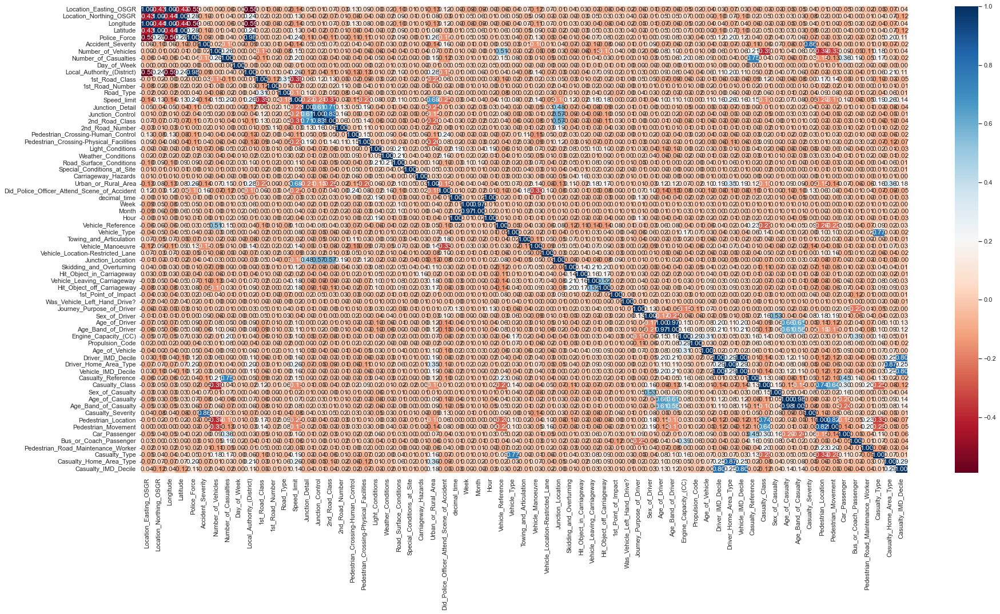

In [162]:
#Correlation heatmap
fig, ax = plt.subplots(figsize=(30, 15))
sns.heatmap(df_ACV.corr(), cmap='RdBu', annot=True, fmt=".2f");

- Highly correlated variables will be dropped because they reduce:
    1. The models' ability to learn;
    2. Model interpretability;
    3. Generalization performance of the test set.

In [163]:
#!pip install mlxtend
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules


# Data Balancing

In [164]:
#First drop datetime and object type variables which could be problematic in balancing
df_ACV = df_ACV.select_dtypes(exclude=['object'])
df_ACV = df_ACV.select_dtypes(exclude=['datetime64[ns]'])

In [165]:
#Check for imbalanced data using the target variable (Accident_Severity)
X = features = df_ACV.drop(["Accident_Severity"], axis=1)
y = target = df_ACV["Accident_Severity"]
target.value_counts()

3    83921
2    23382
1     2215
Name: Accident_Severity, dtype: int64

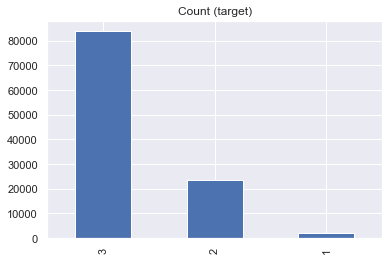

In [166]:
target.value_counts().plot(kind='bar', title='Count (target)');

In [167]:
from imblearn.over_sampling import SMOTE
from collections import Counter

In [168]:
oversample = SMOTE()
X, y = oversample.fit_resample(features.values, target)

Class=3, n=83921 (33.333%)
Class=2, n=83921 (33.333%)
Class=1, n=83921 (33.333%)


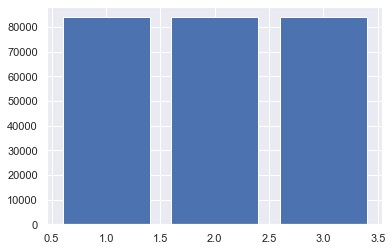

In [169]:
counter = Counter(y)
for k,v in counter.items():
    per = v / len(y) * 100
    
    print('Class=%d, n=%d (%.3f%%)' % (k, v, per))
    
plt.bar(counter.keys(), counter.values())
plt.show();

- Our data is now balanced!

# Feature selection

- We will select the best features using catboostclassifier

In [170]:
X = df_ACV.drop(['Accident_Severity','Number_of_Casualties','Age_of_Casualty','Age_Band_of_Casualty','Casualty_Reference','Vehicle_Reference','Casualty_Class','decimal_time','Casualty_Type','Did_Police_Officer_Attend_Scene_of_Accident','Month','Latitude' ,'Week', 'Hour', 'Longitude','Police_Force','1st_Road_Number', 'Local_Authority_(District)','Location_Easting_OSGR','2nd_Road_Class', 'Location_Northing_OSGR', 'Casualty_Severity'], axis = 1)
y = df_ACV['Accident_Severity']

In [171]:
# Split the data into test and training sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [172]:
#Train model using catboostregressor
model= CatBoostRegressor(eval_metric='MAE') 


In [173]:
model.fit(X_train,y_train,eval_set=[(X_train,y_train),(X_test, y_test)])

Learning rate set to 0.100641
0:	learn: 0.3875004	test: 0.3875004	test1: 0.3858204	best: 0.3858204 (0)	total: 175ms	remaining: 2m 54s
1:	learn: 0.3848606	test: 0.3848606	test1: 0.3831036	best: 0.3831036 (1)	total: 214ms	remaining: 1m 46s
2:	learn: 0.3821963	test: 0.3821963	test1: 0.3804186	best: 0.3804186 (2)	total: 245ms	remaining: 1m 21s
3:	learn: 0.3799661	test: 0.3799661	test1: 0.3781569	best: 0.3781569 (3)	total: 278ms	remaining: 1m 9s
4:	learn: 0.3778198	test: 0.3778198	test1: 0.3760054	best: 0.3760054 (4)	total: 309ms	remaining: 1m 1s
5:	learn: 0.3759977	test: 0.3759977	test1: 0.3742156	best: 0.3742156 (5)	total: 338ms	remaining: 56s
6:	learn: 0.3740333	test: 0.3740333	test1: 0.3722133	best: 0.3722133 (6)	total: 370ms	remaining: 52.5s
7:	learn: 0.3721172	test: 0.3721172	test1: 0.3703295	best: 0.3703295 (7)	total: 402ms	remaining: 49.8s
8:	learn: 0.3707407	test: 0.3707407	test1: 0.3689199	best: 0.3689199 (8)	total: 434ms	remaining: 47.8s
9:	learn: 0.3691522	test: 0.3691522	test1:

96:	learn: 0.3399766	test: 0.3399766	test1: 0.3399522	best: 0.3399522 (96)	total: 1.47s	remaining: 13.7s
97:	learn: 0.3399282	test: 0.3399282	test1: 0.3399304	best: 0.3399304 (97)	total: 1.48s	remaining: 13.6s
98:	learn: 0.3398464	test: 0.3398464	test1: 0.3398993	best: 0.3398993 (98)	total: 1.49s	remaining: 13.6s
99:	learn: 0.3397833	test: 0.3397833	test1: 0.3398526	best: 0.3398526 (99)	total: 1.5s	remaining: 13.5s
100:	learn: 0.3396646	test: 0.3396646	test1: 0.3397733	best: 0.3397733 (100)	total: 1.51s	remaining: 13.5s
101:	learn: 0.3395709	test: 0.3395709	test1: 0.3397047	best: 0.3397047 (101)	total: 1.53s	remaining: 13.4s
102:	learn: 0.3395267	test: 0.3395267	test1: 0.3396857	best: 0.3396857 (102)	total: 1.54s	remaining: 13.4s
103:	learn: 0.3394236	test: 0.3394236	test1: 0.3396181	best: 0.3396181 (103)	total: 1.55s	remaining: 13.3s
104:	learn: 0.3392390	test: 0.3392390	test1: 0.3394435	best: 0.3394435 (104)	total: 1.56s	remaining: 13.3s
105:	learn: 0.3391235	test: 0.3391235	test1: 0

187:	learn: 0.3315659	test: 0.3315659	test1: 0.3341869	best: 0.3341869 (187)	total: 2.51s	remaining: 10.8s
188:	learn: 0.3315286	test: 0.3315286	test1: 0.3341531	best: 0.3341531 (188)	total: 2.52s	remaining: 10.8s
189:	learn: 0.3314570	test: 0.3314570	test1: 0.3341171	best: 0.3341171 (189)	total: 2.53s	remaining: 10.8s
190:	learn: 0.3314187	test: 0.3314187	test1: 0.3340757	best: 0.3340757 (190)	total: 2.54s	remaining: 10.8s
191:	learn: 0.3313083	test: 0.3313083	test1: 0.3340029	best: 0.3340029 (191)	total: 2.55s	remaining: 10.7s
192:	learn: 0.3312202	test: 0.3312202	test1: 0.3339501	best: 0.3339501 (192)	total: 2.56s	remaining: 10.7s
193:	learn: 0.3310962	test: 0.3310962	test1: 0.3338711	best: 0.3338711 (193)	total: 2.57s	remaining: 10.7s
194:	learn: 0.3309921	test: 0.3309921	test1: 0.3337952	best: 0.3337952 (194)	total: 2.59s	remaining: 10.7s
195:	learn: 0.3309356	test: 0.3309356	test1: 0.3337542	best: 0.3337542 (195)	total: 2.6s	remaining: 10.7s
196:	learn: 0.3308529	test: 0.3308529	

276:	learn: 0.3259759	test: 0.3259759	test1: 0.3313383	best: 0.3313383 (276)	total: 3.54s	remaining: 9.24s
277:	learn: 0.3259521	test: 0.3259521	test1: 0.3313525	best: 0.3313383 (276)	total: 3.55s	remaining: 9.22s
278:	learn: 0.3258873	test: 0.3258873	test1: 0.3313124	best: 0.3313124 (278)	total: 3.56s	remaining: 9.2s
279:	learn: 0.3258409	test: 0.3258409	test1: 0.3313118	best: 0.3313118 (279)	total: 3.57s	remaining: 9.19s
280:	learn: 0.3257919	test: 0.3257919	test1: 0.3312834	best: 0.3312834 (280)	total: 3.58s	remaining: 9.17s
281:	learn: 0.3257216	test: 0.3257216	test1: 0.3312520	best: 0.3312520 (281)	total: 3.6s	remaining: 9.15s
282:	learn: 0.3256522	test: 0.3256522	test1: 0.3312128	best: 0.3312128 (282)	total: 3.6s	remaining: 9.13s
283:	learn: 0.3255934	test: 0.3255934	test1: 0.3311782	best: 0.3311782 (283)	total: 3.62s	remaining: 9.12s
284:	learn: 0.3254903	test: 0.3254903	test1: 0.3310932	best: 0.3310932 (284)	total: 3.63s	remaining: 9.1s
285:	learn: 0.3254503	test: 0.3254503	tes

368:	learn: 0.3212140	test: 0.3212140	test1: 0.3290323	best: 0.3290323 (368)	total: 4.56s	remaining: 7.8s
369:	learn: 0.3211960	test: 0.3211960	test1: 0.3290409	best: 0.3290323 (368)	total: 4.57s	remaining: 7.79s
370:	learn: 0.3211433	test: 0.3211433	test1: 0.3290253	best: 0.3290253 (370)	total: 4.58s	remaining: 7.77s
371:	learn: 0.3210905	test: 0.3210905	test1: 0.3290136	best: 0.3290136 (371)	total: 4.6s	remaining: 7.76s
372:	learn: 0.3210334	test: 0.3210334	test1: 0.3289664	best: 0.3289664 (372)	total: 4.61s	remaining: 7.75s
373:	learn: 0.3209981	test: 0.3209981	test1: 0.3289623	best: 0.3289623 (373)	total: 4.62s	remaining: 7.73s
374:	learn: 0.3209983	test: 0.3209983	test1: 0.3289633	best: 0.3289623 (373)	total: 4.63s	remaining: 7.72s
375:	learn: 0.3209516	test: 0.3209516	test1: 0.3289545	best: 0.3289545 (375)	total: 4.64s	remaining: 7.7s
376:	learn: 0.3208931	test: 0.3208931	test1: 0.3289353	best: 0.3289353 (376)	total: 4.65s	remaining: 7.69s
377:	learn: 0.3208457	test: 0.3208457	te

461:	learn: 0.3170671	test: 0.3170671	test1: 0.3273399	best: 0.3273399 (461)	total: 5.61s	remaining: 6.53s
462:	learn: 0.3170332	test: 0.3170332	test1: 0.3273390	best: 0.3273390 (462)	total: 5.62s	remaining: 6.51s
463:	learn: 0.3169979	test: 0.3169979	test1: 0.3273365	best: 0.3273365 (463)	total: 5.63s	remaining: 6.5s
464:	learn: 0.3169508	test: 0.3169508	test1: 0.3273173	best: 0.3273173 (464)	total: 5.64s	remaining: 6.49s
465:	learn: 0.3169174	test: 0.3169174	test1: 0.3272973	best: 0.3272973 (465)	total: 5.65s	remaining: 6.48s
466:	learn: 0.3168822	test: 0.3168822	test1: 0.3272847	best: 0.3272847 (466)	total: 5.67s	remaining: 6.46s
467:	learn: 0.3168441	test: 0.3168441	test1: 0.3272711	best: 0.3272711 (467)	total: 5.68s	remaining: 6.45s
468:	learn: 0.3167960	test: 0.3167960	test1: 0.3272435	best: 0.3272435 (468)	total: 5.69s	remaining: 6.44s
469:	learn: 0.3167536	test: 0.3167536	test1: 0.3272344	best: 0.3272344 (469)	total: 5.7s	remaining: 6.43s
470:	learn: 0.3167353	test: 0.3167353	t

549:	learn: 0.3137086	test: 0.3137086	test1: 0.3260848	best: 0.3260848 (549)	total: 6.65s	remaining: 5.44s
550:	learn: 0.3136828	test: 0.3136828	test1: 0.3260774	best: 0.3260774 (550)	total: 6.67s	remaining: 5.43s
551:	learn: 0.3136373	test: 0.3136373	test1: 0.3260676	best: 0.3260676 (551)	total: 6.68s	remaining: 5.42s
552:	learn: 0.3136186	test: 0.3136186	test1: 0.3260676	best: 0.3260676 (552)	total: 6.69s	remaining: 5.41s
553:	learn: 0.3135825	test: 0.3135825	test1: 0.3260535	best: 0.3260535 (553)	total: 6.71s	remaining: 5.4s
554:	learn: 0.3134915	test: 0.3134915	test1: 0.3260003	best: 0.3260003 (554)	total: 6.72s	remaining: 5.39s
555:	learn: 0.3134191	test: 0.3134191	test1: 0.3259665	best: 0.3259665 (555)	total: 6.73s	remaining: 5.38s
556:	learn: 0.3133734	test: 0.3133734	test1: 0.3259454	best: 0.3259454 (556)	total: 6.74s	remaining: 5.36s
557:	learn: 0.3133230	test: 0.3133230	test1: 0.3259480	best: 0.3259454 (556)	total: 6.75s	remaining: 5.35s
558:	learn: 0.3132882	test: 0.3132882	

638:	learn: 0.3102439	test: 0.3102439	test1: 0.3248032	best: 0.3248032 (638)	total: 7.69s	remaining: 4.34s
639:	learn: 0.3102028	test: 0.3102028	test1: 0.3247892	best: 0.3247892 (639)	total: 7.7s	remaining: 4.33s
640:	learn: 0.3101391	test: 0.3101391	test1: 0.3247419	best: 0.3247419 (640)	total: 7.71s	remaining: 4.32s
641:	learn: 0.3101025	test: 0.3101025	test1: 0.3247385	best: 0.3247385 (641)	total: 7.73s	remaining: 4.31s
642:	learn: 0.3100437	test: 0.3100437	test1: 0.3247209	best: 0.3247209 (642)	total: 7.74s	remaining: 4.29s
643:	learn: 0.3100210	test: 0.3100210	test1: 0.3247072	best: 0.3247072 (643)	total: 7.75s	remaining: 4.28s
644:	learn: 0.3099924	test: 0.3099924	test1: 0.3246894	best: 0.3246894 (644)	total: 7.76s	remaining: 4.27s
645:	learn: 0.3099728	test: 0.3099728	test1: 0.3246885	best: 0.3246885 (645)	total: 7.77s	remaining: 4.26s
646:	learn: 0.3099523	test: 0.3099523	test1: 0.3246776	best: 0.3246776 (646)	total: 7.78s	remaining: 4.24s
647:	learn: 0.3099297	test: 0.3099297	

722:	learn: 0.3072536	test: 0.3072536	test1: 0.3238367	best: 0.3238367 (722)	total: 8.76s	remaining: 3.36s
723:	learn: 0.3072296	test: 0.3072296	test1: 0.3238274	best: 0.3238274 (723)	total: 8.78s	remaining: 3.35s
724:	learn: 0.3071821	test: 0.3071821	test1: 0.3238019	best: 0.3238019 (724)	total: 8.81s	remaining: 3.34s
725:	learn: 0.3071473	test: 0.3071473	test1: 0.3238006	best: 0.3238006 (725)	total: 8.83s	remaining: 3.33s
726:	learn: 0.3070976	test: 0.3070976	test1: 0.3237825	best: 0.3237825 (726)	total: 8.86s	remaining: 3.33s
727:	learn: 0.3070567	test: 0.3070567	test1: 0.3237518	best: 0.3237518 (727)	total: 8.88s	remaining: 3.32s
728:	learn: 0.3070345	test: 0.3070345	test1: 0.3237376	best: 0.3237376 (728)	total: 8.89s	remaining: 3.31s
729:	learn: 0.3070030	test: 0.3070030	test1: 0.3237248	best: 0.3237248 (729)	total: 8.9s	remaining: 3.29s
730:	learn: 0.3069641	test: 0.3069641	test1: 0.3237177	best: 0.3237177 (730)	total: 8.91s	remaining: 3.28s
731:	learn: 0.3069364	test: 0.3069364	

809:	learn: 0.3043953	test: 0.3043953	test1: 0.3228559	best: 0.3228559 (809)	total: 9.81s	remaining: 2.3s
810:	learn: 0.3043792	test: 0.3043792	test1: 0.3228588	best: 0.3228559 (809)	total: 9.82s	remaining: 2.29s
811:	learn: 0.3043481	test: 0.3043481	test1: 0.3228502	best: 0.3228502 (811)	total: 9.83s	remaining: 2.28s
812:	learn: 0.3043315	test: 0.3043315	test1: 0.3228433	best: 0.3228433 (812)	total: 9.85s	remaining: 2.26s
813:	learn: 0.3043047	test: 0.3043047	test1: 0.3228392	best: 0.3228392 (813)	total: 9.86s	remaining: 2.25s
814:	learn: 0.3042922	test: 0.3042922	test1: 0.3228314	best: 0.3228314 (814)	total: 9.87s	remaining: 2.24s
815:	learn: 0.3042620	test: 0.3042620	test1: 0.3228274	best: 0.3228274 (815)	total: 9.88s	remaining: 2.23s
816:	learn: 0.3042369	test: 0.3042369	test1: 0.3228310	best: 0.3228274 (815)	total: 9.89s	remaining: 2.21s
817:	learn: 0.3041886	test: 0.3041886	test1: 0.3227936	best: 0.3227936 (817)	total: 9.9s	remaining: 2.2s
818:	learn: 0.3041734	test: 0.3041734	te

900:	learn: 0.3016608	test: 0.3016608	test1: 0.3219931	best: 0.3219911 (898)	total: 10.9s	remaining: 1.19s
901:	learn: 0.3016565	test: 0.3016565	test1: 0.3219966	best: 0.3219911 (898)	total: 10.9s	remaining: 1.18s
902:	learn: 0.3016403	test: 0.3016403	test1: 0.3219954	best: 0.3219911 (898)	total: 10.9s	remaining: 1.17s
903:	learn: 0.3016086	test: 0.3016086	test1: 0.3219757	best: 0.3219757 (903)	total: 10.9s	remaining: 1.16s
904:	learn: 0.3015786	test: 0.3015786	test1: 0.3219736	best: 0.3219736 (904)	total: 10.9s	remaining: 1.15s
905:	learn: 0.3015398	test: 0.3015398	test1: 0.3219590	best: 0.3219590 (905)	total: 10.9s	remaining: 1.13s
906:	learn: 0.3015239	test: 0.3015239	test1: 0.3219508	best: 0.3219508 (906)	total: 10.9s	remaining: 1.12s
907:	learn: 0.3015037	test: 0.3015037	test1: 0.3219362	best: 0.3219362 (907)	total: 10.9s	remaining: 1.11s
908:	learn: 0.3014807	test: 0.3014807	test1: 0.3219299	best: 0.3219299 (908)	total: 11s	remaining: 1.1s
909:	learn: 0.3014600	test: 0.3014600	te

988:	learn: 0.2991565	test: 0.2991565	test1: 0.3211371	best: 0.3211371 (988)	total: 11.9s	remaining: 132ms
989:	learn: 0.2991144	test: 0.2991144	test1: 0.3211328	best: 0.3211328 (989)	total: 11.9s	remaining: 120ms
990:	learn: 0.2990866	test: 0.2990866	test1: 0.3211329	best: 0.3211328 (989)	total: 11.9s	remaining: 108ms
991:	learn: 0.2990739	test: 0.2990739	test1: 0.3211237	best: 0.3211237 (991)	total: 11.9s	remaining: 96.1ms
992:	learn: 0.2990224	test: 0.2990224	test1: 0.3210867	best: 0.3210867 (992)	total: 11.9s	remaining: 84.1ms
993:	learn: 0.2990071	test: 0.2990071	test1: 0.3210786	best: 0.3210786 (993)	total: 11.9s	remaining: 72.1ms
994:	learn: 0.2989845	test: 0.2989845	test1: 0.3210823	best: 0.3210786 (993)	total: 12s	remaining: 60.1ms
995:	learn: 0.2989700	test: 0.2989700	test1: 0.3210814	best: 0.3210786 (993)	total: 12s	remaining: 48.1ms
996:	learn: 0.2989451	test: 0.2989451	test1: 0.3210808	best: 0.3210786 (993)	total: 12s	remaining: 36ms
997:	learn: 0.2989059	test: 0.2989059	t

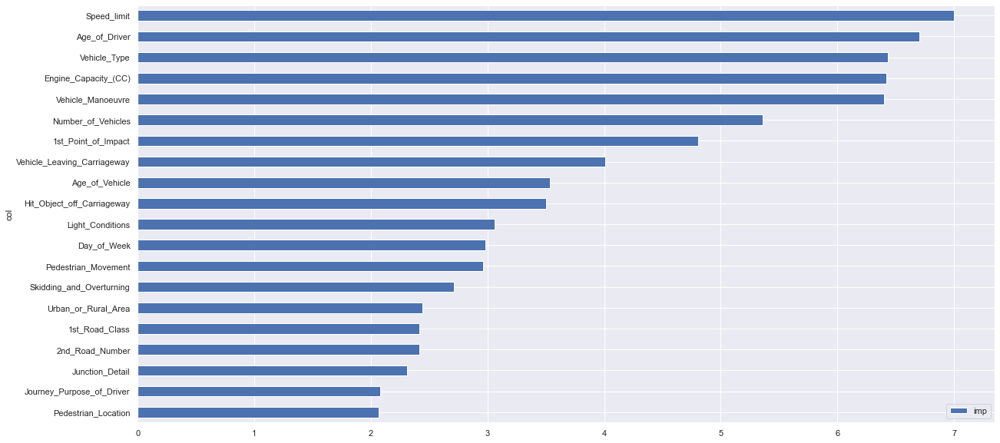

In [174]:
feature_importance = pd.DataFrame({'imp':model.feature_importances_, 'col': X.columns})
feature_importance = feature_importance.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-20:]
feature_importance.plot(kind='barh', x='col', y='imp', figsize=(20, 10));
 

- (i) Predicting Time and Location of Accidents, and Accident severity

- LOCATION

In [175]:
import plotly.express as px


In [176]:
fig = px.density_mapbox(df_geo, lat = 'Latitude', lon = 'Longitude',
                        radius = 10, center = dict(lat=9, lon=9), zoom =1, 
                        mapbox_style = 'open-street-map', 
                        title = 'Likely Accident Locations')
fig.show()

# Modelling

In [177]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

#Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)



In [178]:
#Use function to build models
def models(X_train, y_train, X_test, y_test, model):

    feature_importance.fit(X_train, y_train)

    y_pred = feature_importance.predict(X_test)
    training_accuracy = round(feature_importance.score(X_train, y_train)*100,2)
    score = round(accuracy_score(y_pred, y_test)*100,2)
    confusion = classification_report(y_pred, y_test)
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(pd.DataFrame(cm), annot = True, cmap = "Set3", fmt='g')
    print(f" Training Accuracy is: {training_accuracy}")
    print(f" Test Accuracy is: {score}")
    print(confusion)

    return score

In [179]:
#Use function to build models
def models(X_train, y_train, X_test, y_test, model):

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    training_accuracy = round(model.score(X_train, y_train)*100,2)
    score = round(accuracy_score(y_pred, y_test)*100,2)
    confusion = classification_report(y_pred, y_test)
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(pd.DataFrame(cm), annot = True, cmap = "Set3", fmt='g')
    print(f" Training Accuracy is: {training_accuracy}")
    print(f" Test Accuracy is: {score}")
    print(confusion)

    return score

 Training Accuracy is: 64.25
 Test Accuracy is: 64.32
              precision    recall  f1-score   support

           1       0.44      0.07      0.12      2818
           2       0.18      0.29      0.22      2962
           3       0.78      0.81      0.79     16124

    accuracy                           0.64     21904
   macro avg       0.47      0.39      0.38     21904
weighted avg       0.65      0.64      0.63     21904



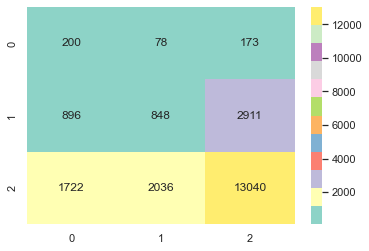

In [180]:
#Naive Bayes
naive = models(X_train, y_train, X_test, y_test, GaussianNB())

- Low accuracy but model generalises.

 Training Accuracy is: 100.0
 Test Accuracy is: 72.82
              precision    recall  f1-score   support

           1       0.34      0.33      0.34       466
           2       0.45      0.41      0.43      5112
           3       0.82      0.84      0.83     16326

    accuracy                           0.73     21904
   macro avg       0.54      0.53      0.53     21904
weighted avg       0.72      0.73      0.72     21904



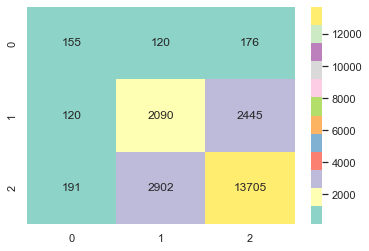

In [181]:
#Decision Tree
tree = models(X_train, y_train, X_test, y_test, DecisionTreeClassifier())

- Model overfits.

 Training Accuracy is: 100.0
 Test Accuracy is: 81.64
              precision    recall  f1-score   support

           1       0.25      0.97      0.40       118
           2       0.27      0.78      0.40      1597
           3       0.98      0.82      0.89     20189

    accuracy                           0.82     21904
   macro avg       0.50      0.86      0.57     21904
weighted avg       0.93      0.82      0.85     21904



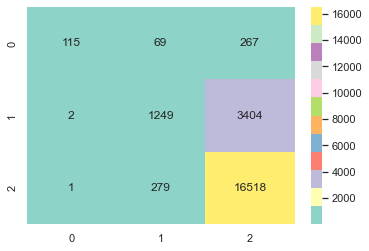

In [182]:
#Random Forest
forest = models(X_train, y_train, X_test, y_test, RandomForestClassifier())

 Training Accuracy is: 81.89
 Test Accuracy is: 74.8
              precision    recall  f1-score   support

           1       0.14      0.28      0.19       236
           2       0.23      0.41      0.29      2585
           3       0.91      0.80      0.85     19083

    accuracy                           0.75     21904
   macro avg       0.43      0.49      0.44     21904
weighted avg       0.82      0.75      0.78     21904



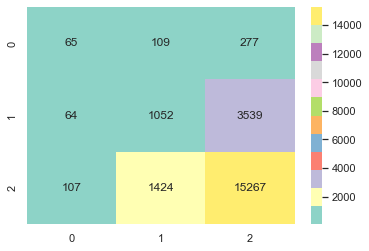

In [183]:
#K-Nearest Neighbor
knn = models(X_train, y_train, X_test, y_test, KNeighborsClassifier())

 Training Accuracy is: 77.47
 Test Accuracy is: 77.52
              precision    recall  f1-score   support

           1       0.06      0.89      0.10        28
           2       0.07      0.58      0.13       602
           3       0.99      0.78      0.87     21274

    accuracy                           0.78     21904
   macro avg       0.37      0.75      0.37     21904
weighted avg       0.96      0.78      0.85     21904



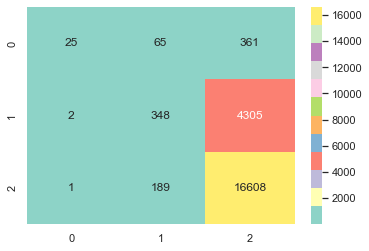

In [184]:
GBC = models(X_train, y_train, X_test, y_test, GradientBoostingClassifier())

- I have chosen to optimize Random Forest using the GridSearchCV

In [185]:
#Tune hyperparameter using GridSearchCV and fit data
forest = RandomForestClassifier(random_state = 0, n_jobs = -1)

In [186]:
parameters = {'max_depth': [2,3,5,10,20],
             'min_samples_leaf': [5,10,20,50,100,200],
             'n_estimators': [10,25,30,50,100,200]
             }

In [187]:
from sklearn.model_selection import GridSearchCV


In [188]:
#instantiate the grid search model
grid_search = GridSearchCV(estimator=forest, param_grid=parameters, cv = 4, n_jobs =-1, verbose=1, scoring = "accuracy")

In [189]:
%%time
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 180 candidates, totalling 720 fits
CPU times: total: 47.7 s
Wall time: 13min


GridSearchCV(cv=4, estimator=RandomForestClassifier(n_jobs=-1, random_state=0),
             n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 200],
                         'n_estimators': [10, 25, 30, 50, 100, 200]},
             scoring='accuracy', verbose=1)

In [190]:
grid_search.best_score_

0.7790992207007276

In [191]:
forest_best = grid_search.best_estimator_
forest_best

RandomForestClassifier(max_depth=20, min_samples_leaf=5, n_jobs=-1,
                       random_state=0)

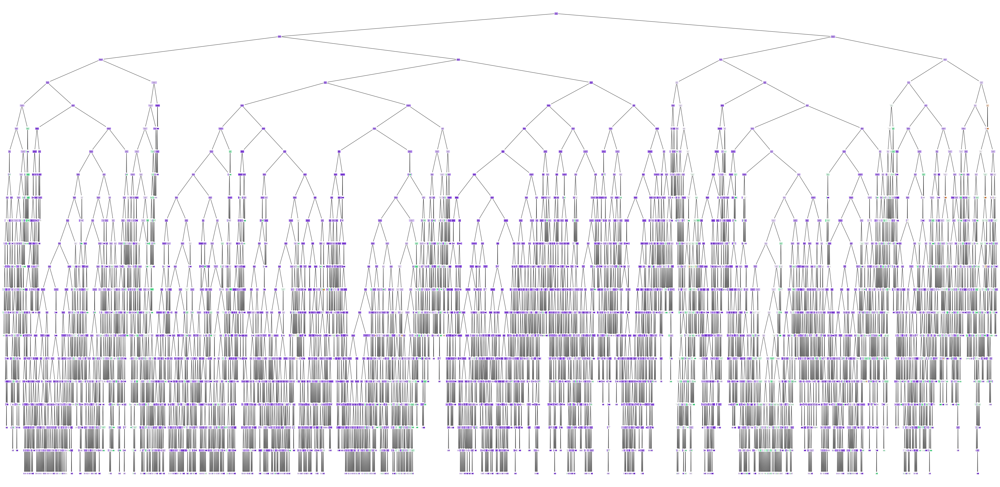

In [192]:
#The best set of parameters are identified above
#We can now visualize

from sklearn.tree import plot_tree
plt.figure(figsize = (60,30))
plot_tree(forest_best.estimators_[20], feature_names = X.columns,class_names=['Fatal','Serious','Slight'],filled=True);

In [193]:
#Sort data with feature importance
forest_best.feature_importances_

array([0.03164543, 0.04243128, 0.02704138, 0.01499894, 0.03531659,
       0.02257457, 0.01144508, 0.01877893, 0.00122479, 0.01188126,
       0.02073739, 0.01381021, 0.0131124 , 0.00213473, 0.00211879,
       0.01826767, 0.04516603, 0.00106653, 0.06411495, 0.00542799,
       0.023386  , 0.02199153, 0.00942782, 0.02278373, 0.02000663,
       0.04054613, 0.00056755, 0.02502944, 0.01402932, 0.0746061 ,
       0.03596583, 0.06873955, 0.00985646, 0.0501482 , 0.03403981,
       0.01000474, 0.03465894, 0.01014948, 0.016718  , 0.01533809,
       0.01021458, 0.00328787, 0.00066607, 0.0092657 , 0.0352775 ])

In [194]:
importances_df_ACV = pd.DataFrame({"Variablename": X_train.columns,
                            "Importances": forest_best.feature_importances_
                                    })

In [195]:
#important_features and values
importances_df_ACV.sort_values(['Importances', 'Variablename'], ascending=[True, False]).iloc[-20:]



,Variablename,Importances
10,Light_Conditions,0.020737
21,Skidding_and_Overturning,0.021992
5,Junction_Detail,0.022575
23,Vehicle_Leaving_Carriageway,0.022784
20,Junction_Location,0.023386
27,Journey_Purpose_of_Driver,0.025029
2,1st_Road_Class,0.027041
0,Number_of_Vehicles,0.031645
34,Driver_IMD_Decile,0.034040
36,Vehicle_IMD_Decile,0.034659


In [196]:
from sklearn.feature_selection import SelectFromModel
# Create random forest classifier
randomforest = RandomForestClassifier(random_state=0, n_jobs=-1, max_depth = 4)

# Create object that selects features with importance greater # than or equal to a threshold
selector = SelectFromModel(randomforest, threshold=0.05)
    
# Feature new feature matrix using selector
importances_df_ACV = selector.fit_transform(X_train, y_train) # Train random forest using most important features

rf_model = randomforest.fit(importances_df_ACV, y_train)

 Training Accuracy is: 30.19
 Test Accuracy is: 76.69
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         0
           2       0.00      0.00      0.00         0
           3       1.00      0.77      0.87     21904

    accuracy                           0.77     21904
   macro avg       0.33      0.26      0.29     21904
weighted avg       1.00      0.77      0.87     21904



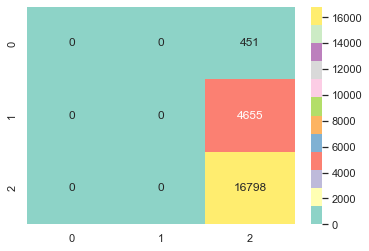

In [197]:
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)
training_accuracy = round(rf_model.score(X_train, y_train)*100,2)
score = round(accuracy_score(y_pred, y_test)*100,2)
confusion = classification_report(y_pred, y_test)
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(pd.DataFrame(cm), annot = True, cmap = "Set3", fmt='g')
training_accuracy = round(model.score(X_train, y_train)*100,2)
print(f" Training Accuracy is: {training_accuracy}")
print(f" Test Accuracy is: {score}")
print(confusion)

# Summary and comparison of models

In [198]:
data = {"Models": ["NaiveBayes","DecisionTree","RandomForest","KNN","GradientBoostClassifier","Optimized RandomForest"],
        "Training_accuracy": [64.25, 100.0, 100.0, 81.89, 77.47, 30.09],       
        "Test_accuracy": [64.32, 72.82, 81.64, 74.80, 77.52, 76.69],
       "Precision": [65.0, 72.0, 93.0, 82.0, 96.0, 100.0],
       "Recall": [64.0, 73.0, 82.0, 75.0, 78.0, 77.0],
       "F1score": [63.0, 72.0, 85.0, 78.0, 85.0, 87.0]}
model_comparison = pd.DataFrame(data = data)

model_comparison

,Models,Training_accuracy,Test_accuracy,Precision,Recall,F1score
0,NaiveBayes,64.25,64.32,65.0,64.0,63.0
1,DecisionTree,100.00,72.87,72.0,73.0,72.0
2,RandomForest,100.00,81.67,93.0,82.0,85.0
3,KNN,81.89,74.80,82.0,75.0,78.0
4,GradientBoostClassifier,77.47,77.52,96.0,78.0,85.0
5,Optimized RandomForest,30.09,76.69,100.0,77.0,87.0


- Decision Tree, RandomForest and KNN overfit!

- Of NaiveBayes,GradientBoostClassifier and Optimized RandomForest, GradientBoostClassifier generalised well and had the best accuracy,precison, recall and F1-score combination.

In [199]:
GBC = GradientBoostingClassifier(n_estimators=50,subsample=0.5).fit(X_test, y_test)

In [200]:
y_pred = GBC.predict(X_test)

# Comparing with Government Model

In [201]:
#load dataset
gov = pd.read_csv('cas_adjustment_lookup_2019.csv')

In [202]:
gov.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3314737 entries, 0 to 3314736
Data columns (total 6 columns):
 #   Column              Dtype  
---  ------              -----  
 0   accident_index      object 
 1   Vehicle_Reference   int64  
 2   Casualty_Reference  int64  
 3   Adjusted_Serious    float64
 4   Adjusted_Slight     float64
 5   Injury_Based        int64  
dtypes: float64(2), int64(3), object(1)
memory usage: 151.7+ MB


In [203]:
gov.isna().sum()

accident_index        0
Vehicle_Reference     0
Casualty_Reference    0
Adjusted_Serious      0
Adjusted_Slight       0
Injury_Based          0
dtype: int64

- Government model did not predict fatal, hence we will drop fatal from our combined dataframe df3

In [214]:
df3 = df3.query("Accident_Severity > 1")

In [215]:
gov.rename({'accident_index': 'Accident_Index'}, axis = 1, inplace = True)

In [216]:
df = [df3, gov] 

In [217]:
df = reduce(lambda left,right: pd.merge(left,right,on=['Accident_Index','Casualty_Reference','Vehicle_Reference'],how='inner'), df)

In [218]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 79222 entries, 0 to 79221
Data columns (total 78 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   Accident_Index                               79222 non-null  object        
 1   Location_Easting_OSGR                        79222 non-null  float64       
 2   Location_Northing_OSGR                       79222 non-null  float64       
 3   Longitude                                    79222 non-null  float64       
 4   Latitude                                     79222 non-null  float64       
 5   Police_Force                                 79222 non-null  int64         
 6   Accident_Severity                            79222 non-null  int64         
 7   Number_of_Vehicles                           79222 non-null  int64         
 8   Number_of_Casualties                         79222 non-null  int64         


In [219]:
#We will drop the ogject and datetime type columns.
df.select_dtypes(exclude=['object','datetime64[ns]'])

,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Day_of_Week,Local_Authority_(District),1st_Road_Class,1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,Junction_Control,2nd_Road_Class,2nd_Road_Number,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,decimal_time,Week,Month,Hour,Vehicle_Reference,Vehicle_Type,Towing_and_Articulation,Vehicle_Manoeuvre,Vehicle_Location-Restricted_Lane,Junction_Location,Skidding_and_Overturning,Hit_Object_in_Carriageway,Vehicle_Leaving_Carriageway,Hit_Object_off_Carriageway,1st_Point_of_Impact,Was_Vehicle_Left_Hand_Drive?,Journey_Purpose_of_Driver,Sex_of_Driver,Age_of_Driver,Age_Band_of_Driver,Engine_Capacity_(CC),Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type,Vehicle_IMD_Decile,Casualty_Reference,Casualty_Class,Sex_of_Casualty,Age_of_Casualty,Age_Band_of_Casualty,Casualty_Severity,Pedestrian_Location,Pedestrian_Movement,Car_Passenger,Bus_or_Coach_Passenger,Pedestrian_Road_Maintenance_Worker,Casualty_Type,Casualty_Home_Area_Type,Casualty_IMD_Decile,Adjusted_Serious,Adjusted_Slight,Injury_Based
0,333177.0,428972.0,-3.014896,53.752825,4,2,1,2,3,74,6,0,9,30,9,4,6,0,0,0,1,1,1,0,0,1,1,15.35,45,11,15,1,9,0,18,0,1,0,0,1,4,1,1,5,2,73,10,1364,1,13,10,2,10,2,2,2,83,11,2,0,0,1,0,0,9,1,5,1.000000,0.000000,1
1,385766.0,432572.0,-2.217534,53.789281,4,3,2,1,3,72,6,0,6,30,1,4,6,0,0,0,1,2,2,0,0,1,1,17.17,45,11,17,2,9,0,4,0,1,0,0,0,0,2,1,2,1,50,8,1198,1,4,2,1,2,1,1,1,50,8,3,0,0,0,0,0,9,1,2,0.000000,1.000000,1
2,362927.0,424538.0,-2.563216,53.715946,4,3,3,2,4,73,3,674,1,70,0,1,1,0,0,0,1,2,2,0,0,2,1,8.83,49,12,8,1,9,0,4,0,0,0,0,0,0,1,1,5,1,52,8,1,1,1,2,1,2,1,1,1,52,8,3,0,0,0,0,0,9,1,2,0.000000,1.000000,1
3,362927.0,424538.0,-2.563216,53.715946,4,3,3,2,4,73,3,674,1,70,0,1,1,0,0,0,1,2,2,0,0,2,1,8.83,49,12,8,2,9,0,4,0,0,0,0,0,0,2,1,5,1,26,6,4367,2,5,4,1,4,2,1,1,26,6,3,0,0,0,0,0,9,1,4,0.000000,1.000000,1
4,343428.0,410737.0,-2.856124,53.590161,4,3,2,1,4,84,3,59,3,30,7,4,6,0,0,0,1,1,1,0,0,2,1,9.58,49,12,9,2,9,0,4,0,1,0,0,0,0,2,1,6,2,58,9,1197,1,4,6,3,6,1,1,2,58,9,3,0,0,0,0,0,9,3,6,0.000000,1.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79217,312635.0,573392.0,-3.368899,55.047323,98,3,1,1,7,917,4,725,6,60,0,1,1,0,0,0,1,1,2,0,0,2,1,1.00,20,5,1,1,19,0,17,0,0,1,0,1,0,1,1,1,1,24,5,1997,2,14,6,3,6,1,1,1,24,5,3,0,0,0,0,0,19,3,6,0.183336,0.816664,0
79218,337522.0,591682.0,-2.983499,55.215407,98,3,4,1,5,917,3,7,6,60,0,1,1,0,0,0,1,1,2,0,0,2,1,8.77,22,5,8,1,19,4,18,0,0,0,0,0,0,3,1,1,1,22,5,2143,2,1,1,1,1,1,1,1,22,5,3,0,0,0,0,0,19,1,1,0.074588,0.925412,0
79219,318544.0,567087.0,-3.274645,54.991685,98,3,2,1,6,917,4,723,6,60,3,4,4,721,0,0,1,1,1,0,0,2,2,15.50,25,6,15,2,9,0,18,0,1,0,0,0,0,0,1,6,1,61,9,2967,2,5,7,3,7,1,1,1,61,9,3,0,0,0,0,0,9,3,7,0.048524,0.951476,0
79220,336525.0,584226.0,-2.997491,55.148292,98,3,1,1,7,917,6,710,6,30,3,4,6,723,0,0,1,1,1,0,0,2,2,14.17,26,6,14,1,9,0,7,0,6,0,0,3,0,3,1,5,1,78,11,1597,2,6,8,3,8,1,3,1,54,8,3,5,3,0,0,0,0,3,8,0.183316,0.816684,0


In [220]:
#We create a create a new list for Adjusted_Serious and Adjusted_Slight 
df['max'] = df[['Adjusted_Serious','Adjusted_Slight']].idxmax(axis=1)

In [221]:
df['max'].sample(10)

30390    Adjusted_Serious
13947     Adjusted_Slight
25570     Adjusted_Slight
62413    Adjusted_Serious
31864     Adjusted_Slight
12131     Adjusted_Slight
65123     Adjusted_Slight
9476      Adjusted_Slight
66452    Adjusted_Serious
78902     Adjusted_Slight
Name: max, dtype: object

In [222]:
#Mapping our new severity to numerical codes
def map_to_numerical(Column):
    if Column == 'Adjusted_Serious':
        return 2
    else:
        return 3

In [223]:
#convert to numerical
df['map'] = df['max'].apply(map_to_numerical)

In [224]:
df_pred = df['map']
actual = df['Accident_Severity']

In [225]:
print("Government model Accuracy score : {:.4f}".format(metrics.accuracy_score(actual,df_pred)))

Government model Accuracy score : 0.9473


- It is obvious that the Government model performed way better at 94.73% than our best model 77.52%.